In [1]:
import os

import umap
%load_ext autoreload
%autoreload 1
os.environ["CUDA_VISIBLE_DEVICES"] = "3"

%aimport models.adaptation
%aimport HookedRecursiveCNN
%aimport modules.divisive_norm
from models.adaptation import Adaptation
from HookedRecursiveCNN import HookedRecursiveCNN
from utils.visualization import visualize_first_batch_with_timesteps
from torch.utils.data import DataLoader
from models.noisy_dataloader import NoisyTemporalDataset
from functools import partial
from utils.transforms import RandomRepeatedNoise, MeanFlat
from modules.divisive_norm_group import DivisiveNormGroup
from modules.divisive_norm import DivisiveNorm
from modules.exponential_decay import ExponentialDecay
from modules.lateral_recurrence import LateralRecurrence
from pytorch_lightning.loggers import CSVLogger
import torchvision.transforms as transforms
import json
import pytorch_lightning as pl
import torch

In [2]:
from torch.utils.data import Dataset


class EvalDataWrapper(Dataset):
    """Simple Wrapper that adds contrast and repeated noise information to the dataset to power
    the evaluation metrics"""

    def __init__(self, dataset, contrast, rep_noise):
        self.dataset = dataset
        self.contrast = float(contrast)
        self.rep_noise = bool(rep_noise)

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        x, y = self.dataset[idx]
        if type(idx) == int:
            idx = torch.tensor([idx])
        contrast = torch.full_like(idx, self.contrast, dtype=torch.float)
        rep_noise = torch.full_like(idx, self.rep_noise, dtype=torch.bool)
        return x, y, contrast, rep_noise

In [3]:
def get_dataloaders(dataset_name='fashion_mnist'):
    dataset = dataset_name
    contrast = 'random'
    repeat_noise = True

    noise_transformer = RandomRepeatedNoise(contrast=contrast, repeat_noise_at_test=repeat_noise)
    noise_transformer_test = partial(noise_transformer, stage='test')
    first_in_line_transformer = partial(noise_transformer, stage='test', first_in_line=True)
    transform = transforms.Compose([
            transforms.ToTensor(),
            # transforms.Normalize((0.5,), (0.5,))
        ])
    timestep_transforms = [noise_transformer] + [MeanFlat()] + [first_in_line_transformer]
    # Create instances of the Fashion MNIST dataset
    train_dataset = NoisyTemporalDataset('train', dataset=dataset, transform=transform,
                                         img_to_timesteps_transforms=timestep_transforms)
    
    test_sets = []
    
    for repeat_noise in [True, False]:
        # for the val set to power evals, we need to explicitly add contrast information to every sample
        cs = [0.2, 0.4, 0.6, 0.8, 1.0] if contrast == 'random' else [contrast]
        for c in cs:
            noise_transformer = RandomRepeatedNoise(contrast=c,
                                                    repeat_noise_at_test=repeat_noise)
            noise_transformer_test = partial(noise_transformer, stage='test')
            first_in_line_transformer = partial(noise_transformer, stage='test', first_in_line=True)
            timestep_transforms = [noise_transformer] + [MeanFlat()] + [first_in_line_transformer]
            test_sets.append(EvalDataWrapper(NoisyTemporalDataset('test', dataset=dataset,
                                                                  transform=transform,
                                                                  img_to_timesteps_transforms=timestep_transforms),
                                             contrast=c, rep_noise=repeat_noise))
    test_dataset = torch.utils.data.ConcatDataset(test_sets)
    
    # Create the DataLoaders for the Fashion MNIST dataset
    train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True, num_workers=3)
    test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False, num_workers=3)
    return train_loader, test_loader, train_dataset, test_dataset

In [ ]:
train_loader, test_loader, train_dataset, test_dataset = get_dataloaders('fashion_mnist')

In [4]:
# load model
with open('config.json', 'r') as f:
    config = json.load(f)
hooked_cnn = HookedRecursiveCNN(3, config['layer_kwargs_fmnist'], ExponentialDecay, 
                                [
    {"alpha_init":  1.0, "train_alpha": False, "beta_init": 1, "train_beta": False},
    {"alpha_init":  1.0, "train_alpha": False, "beta_init": 1, "train_beta": False},
    {"alpha_init":  1.0, "train_alpha": False, "beta_init": 1, "train_beta": False},
    {"alpha_init":  1.0, "train_alpha": False, "beta_init": 1, "train_beta": False}
  ]
                                )
model = Adaptation.load_from_checkpoint(
    'learned_models/baseline_generalization_ExponentialDecay_contrast_random_repeat_noise_True_epoch_10.ckpt', model=hooked_cnn)

models = {}
models['baseline'] = model

additive_hooked_cnn = HookedRecursiveCNN(3, config['layer_kwargs_fmnist'], ExponentialDecay,
                                config['adaptation_kwargs_additive'])
additive_model = Adaptation.load_from_checkpoint(
    'learned_models/generalization_ExponentialDecay_contrast_random_repeat_noise_True_epoch_10.ckpt',
    model=additive_hooked_cnn)
models['additive'] = additive_model

divisive_hooked_cnn = HookedRecursiveCNN(3, config['layer_kwargs_fmnist'], DivisiveNorm,
                                config['adaptation_kwargs_div_norm'])
divisive_model = Adaptation.load_from_checkpoint(
    'learned_models/generalization_DivisiveNorm_contrast_random_repeat_noise_True_epoch_10.ckpt',
    model=divisive_hooked_cnn)
models['divisive'] = divisive_model


wandb: Currently logged in as: georglange. Use `wandb login --relogin` to force relogin


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


baseline


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Testing: 0it [00:00, ?it/s]

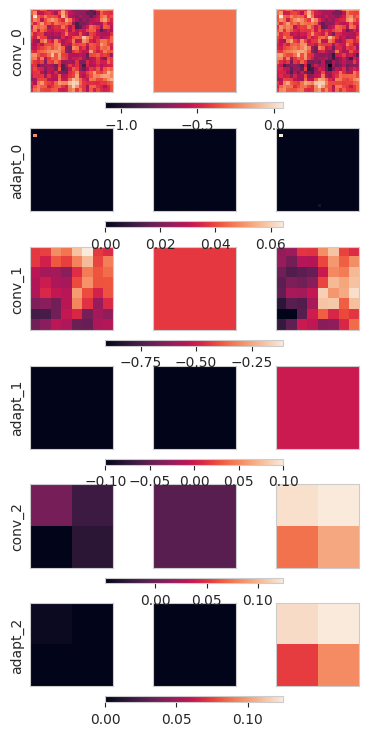

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.



┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       acc/0.2_False       │    0.6255000233650208     │
│       acc/0.2_True        │    0.6270999908447266     │
│       acc/0.4_False       │    0.7346000075340271     │
│       acc/0.4_True        │     0.73580002784729      │
│       acc/0.6_False       │     0.769599974155426     │
│       acc/0.6_True        │    0.7700999975204468     │
│       acc/0.8_False       │    0.7867000102996826     │
│       acc/0.8_True        │    0.7857000231742859     │
│       acc/1.0_False       │    0.7976999878883362     │
│       acc/1.0_True        │    0.7947999835014343     │
│       acc_diff/0.2        │   0.0015999999595806003   │
│       acc_diff/0.4        │   0.0012000000569969416   │
│       acc_diff/0.6        │   0.0005000000237487257   │
│       acc_diff/0.8        │  -0.0010000000474974513   │
│       acc_diff/1.0        │   -0.002899999963119626   │
│   cum_actv_diff/0.2_l0    │  -4.597823499352671e-05   │
│   cum_actv_diff/0.2_l1    │  -0.00016982796660158783  │
│   cum_actv_diff/0.2_l2    │  -0.00015145917132031173  │
│   cum_actv_diff/0.4_l0    │   4.079269274370745e-06   │
│   cum_actv_diff/0.4_l1    │  2.6541911211097613e-05   │
│   cum_actv_diff/0.4_l2    │  2.3018781575956382e-05   │
│   cum_actv_diff/0.6_l0    │  -1.0427648703625891e-05  │
│   cum_actv_diff/0.6_l1    │  -2.3981569029274397e-05  │
│   cum_actv_diff/0.6_l2    │   6.484377991000656e-06   │
│   cum_actv_diff/0.8_l0    │   3.346566518303007e-05   │
│   cum_actv_diff/0.8_l1    │   4.211049235891551e-05   │
│   cum_actv_diff/0.8_l2    │   0.0001257513795280829   │
│   cum_actv_diff/1.0_l0    │  4.1196301026502624e-05   │
│   cum_actv_diff/1.0_l1    │  0.00013166172720957547   │
│   cum_actv_diff/1.0_l2    │  0.00014461226237472147   │
│         test_acc          │    0.7427600026130676     │
│         test_loss         │    0.6912083029747009     │
└───────────────────────────┴───────────────────────────┘

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


additive


Testing: 0it [00:00, ?it/s]

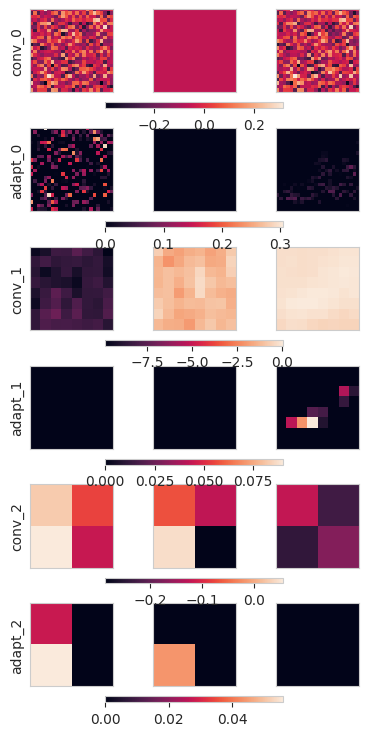

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.



┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       acc/0.2_False       │    0.18970000743865967    │
│       acc/0.2_True        │    0.8597999811172485     │
│       acc/0.4_False       │    0.3294999897480011     │
│       acc/0.4_True        │    0.8636999726295471     │
│       acc/0.6_False       │    0.4666000008583069     │
│       acc/0.6_True        │    0.8651000261306763     │
│       acc/0.8_False       │    0.5817999839782715     │
│       acc/0.8_True        │    0.8644999861717224     │
│       acc/1.0_False       │    0.6571999788284302     │
│       acc/1.0_True        │    0.8639000058174133     │
│       acc_diff/0.2        │    0.6700999736785889     │
│       acc_diff/0.4        │    0.5342000126838684     │
│       acc_diff/0.6        │     0.398499995470047     │
│       acc_diff/0.8        │    0.2827000021934509     │
│       acc_diff/1.0        │    0.20669999718666077    │
│   cum_actv_diff/0.2_l0    │   0.041146066039800644    │
│   cum_actv_diff/0.2_l1    │  -0.0012522988254204392   │
│   cum_actv_diff/0.2_l2    │  -0.0034088725224137306   │
│   cum_actv_diff/0.4_l0    │   0.034452397376298904    │
│   cum_actv_diff/0.4_l1    │   -0.004723710007965565   │
│   cum_actv_diff/0.4_l2    │   -0.009494708850979805   │
│   cum_actv_diff/0.6_l0    │   0.028522321954369545    │
│   cum_actv_diff/0.6_l1    │   -0.007108903955668211   │
│   cum_actv_diff/0.6_l2    │   -0.01471665594726801    │
│   cum_actv_diff/0.8_l0    │    0.02367093414068222    │
│   cum_actv_diff/0.8_l1    │   -0.008473586291074753   │
│   cum_actv_diff/0.8_l2    │   -0.017522970214486122   │
│   cum_actv_diff/1.0_l0    │    0.0196014866232872     │
│   cum_actv_diff/1.0_l1    │   -0.008882180787622929   │
│   cum_actv_diff/1.0_l2    │   -0.01825086399912834    │
│         test_acc          │    0.6541799902915955     │
│         test_loss         │     1.233538031578064     │
└───────────────────────────┴───────────────────────────┘

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


divisive


Testing: 0it [00:00, ?it/s]

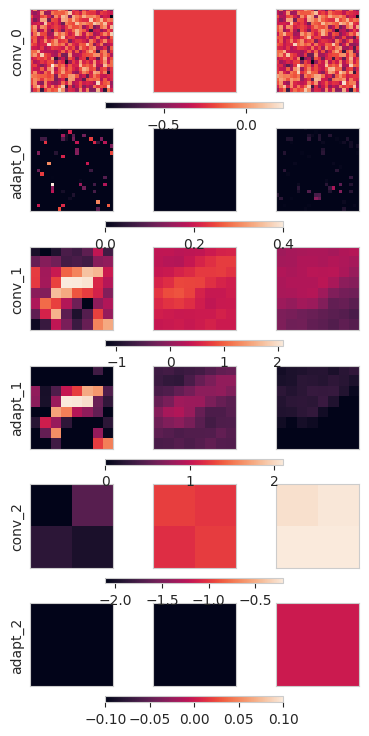

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.



┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       acc/0.2_False       │    0.31769999861717224    │
│       acc/0.2_True        │    0.7950000166893005     │
│       acc/0.4_False       │    0.5135999917984009     │
│       acc/0.4_True        │     0.826200008392334     │
│       acc/0.6_False       │    0.6541000008583069     │
│       acc/0.6_True        │     0.829800009727478     │
│       acc/0.8_False       │     0.732200026512146     │
│       acc/0.8_True        │    0.8334000110626221     │
│       acc/1.0_False       │    0.7623000144958496     │
│       acc/1.0_True        │    0.8361999988555908     │
│       acc_diff/0.2        │    0.4772999882698059     │
│       acc_diff/0.4        │    0.3125999867916107     │
│       acc_diff/0.6        │    0.17569999396800995    │
│       acc_diff/0.8        │    0.10119999945163727    │
│       acc_diff/1.0        │    0.0738999992609024     │
│   cum_actv_diff/0.2_l0    │    0.03740139678120613    │
│   cum_actv_diff/0.2_l1    │   0.019634488970041275    │
│   cum_actv_diff/0.2_l2    │   -0.01674841344356537    │
│   cum_actv_diff/0.4_l0    │    0.03603801503777504    │
│   cum_actv_diff/0.4_l1    │   0.012806227430701256    │
│   cum_actv_diff/0.4_l2    │   -0.01531117781996727    │
│   cum_actv_diff/0.6_l0    │   0.033518657088279724    │
│   cum_actv_diff/0.6_l1    │   0.008070435374975204    │
│   cum_actv_diff/0.6_l2    │   -0.012062701396644115   │
│   cum_actv_diff/0.8_l0    │    0.03067580610513687    │
│   cum_actv_diff/0.8_l1    │   0.005162633955478668    │
│   cum_actv_diff/0.8_l2    │   -0.007534215226769447   │
│   cum_actv_diff/1.0_l0    │   0.027485830709338188    │
│   cum_actv_diff/1.0_l1    │   0.003823772305622697    │
│   cum_actv_diff/1.0_l2    │  -0.0029410100542008877   │
│         test_acc          │    0.7100499868392944     │
│         test_loss         │    0.8357818722724915     │
└───────────────────────────┴───────────────────────────┘

<Axes: xlabel='name', ylabel='test_acc'>

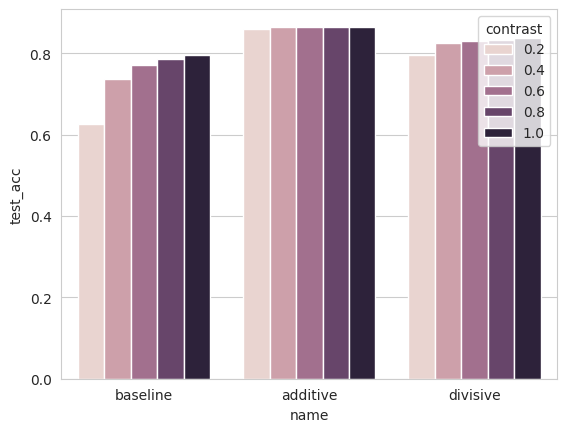

In [5]:
wandb_logger = pl.loggers.WandbLogger(project='ai-thesis', config=config,
                                                      name=f'del')
trainer = pl.Trainer(logger=wandb_logger)
results = {'name': [], 'test_acc': [], 'contrast': []}
for name, model in models.items():
    print(name)
    res = trainer.test(model, test_loader)
    for contrast in [0.2, 0.4, 0.6, 0.8, 1.0]:
        results['name'].append(name)
        results['test_acc'].append(res[0][f'acc/{contrast}_True'])
        results['contrast'].append(contrast)
    
import seaborn as sns

sns.barplot(x='name', y='test_acc', data=results, hue='contrast')

<Axes: xlabel='name', ylabel='test_acc'>

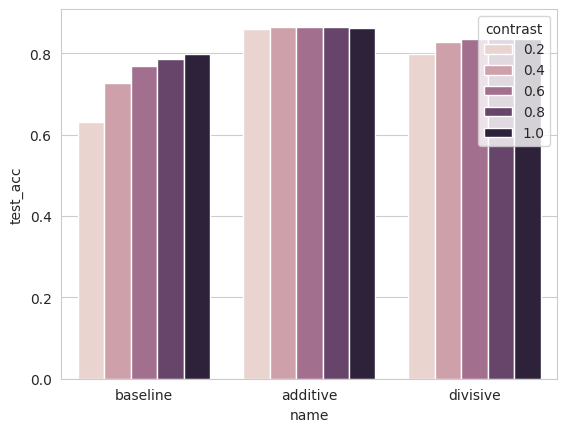

In [50]:
sns.barplot(x='name', y='test_acc', data=results, hue='contrast')

In [16]:
from tqdm import tqdm


def get_activations(layer, loader):
    all_activations = []
    labels = []
    for batch in tqdm(loader):
        x, y = batch
        l, cache = hooked_cnn.run_with_cache(x)
        activations = cache[f'hks.adapt_{layer}_2']
        all_activations.append(activations)
        labels.append(y)
    return torch.cat(all_activations, dim=0), torch.cat(labels, dim=0)
actvs, labels = get_activations('1', train_loader)
actvs.shape, labels.shape

100%|██████████| 938/938 [00:31<00:00, 29.41it/s]


(torch.Size([60000, 32, 8, 8]), torch.Size([60000]))

In [29]:
actvs = actvs.view(actvs.shape[0], -1).detach().numpy()

100%|██████████| 938/938 [00:34<00:00, 27.25it/s]


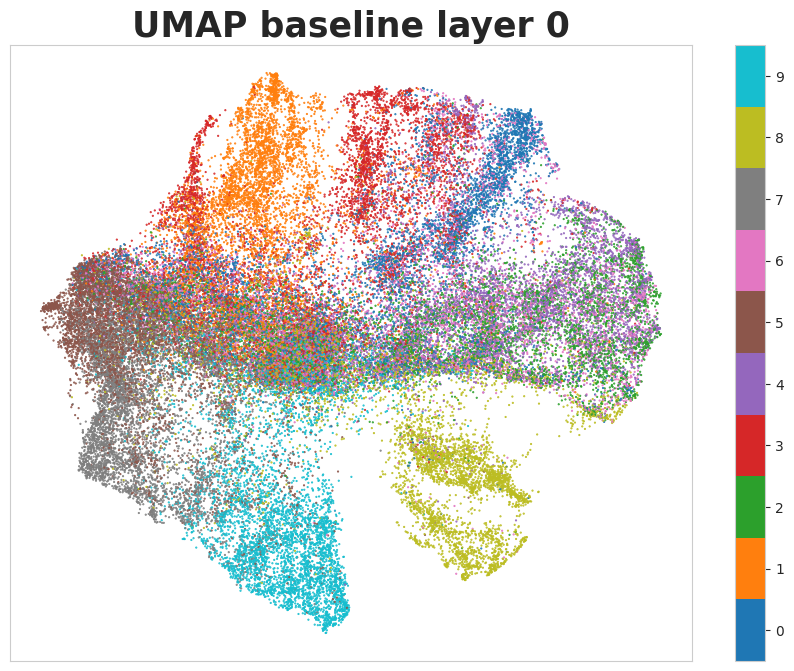

100%|██████████| 938/938 [00:35<00:00, 26.48it/s]


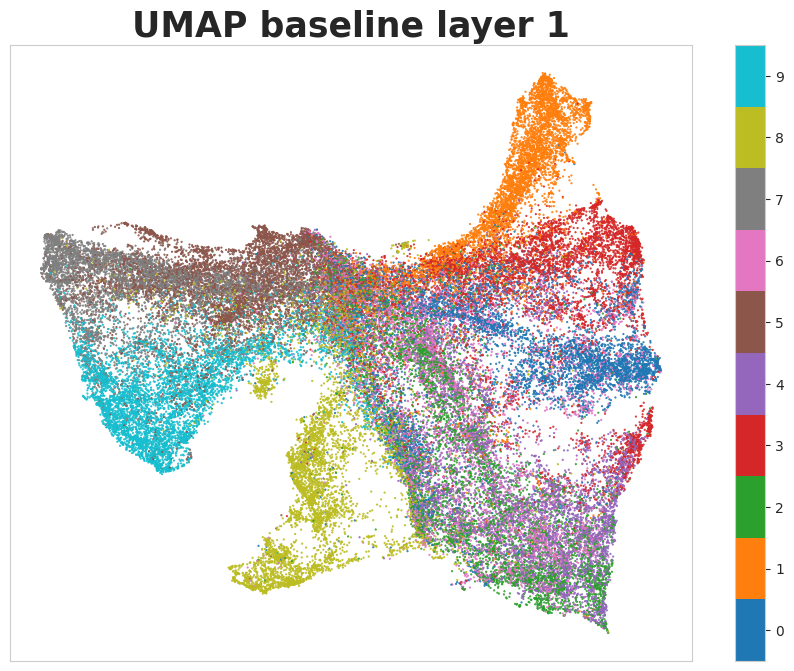

100%|██████████| 938/938 [00:33<00:00, 28.25it/s]


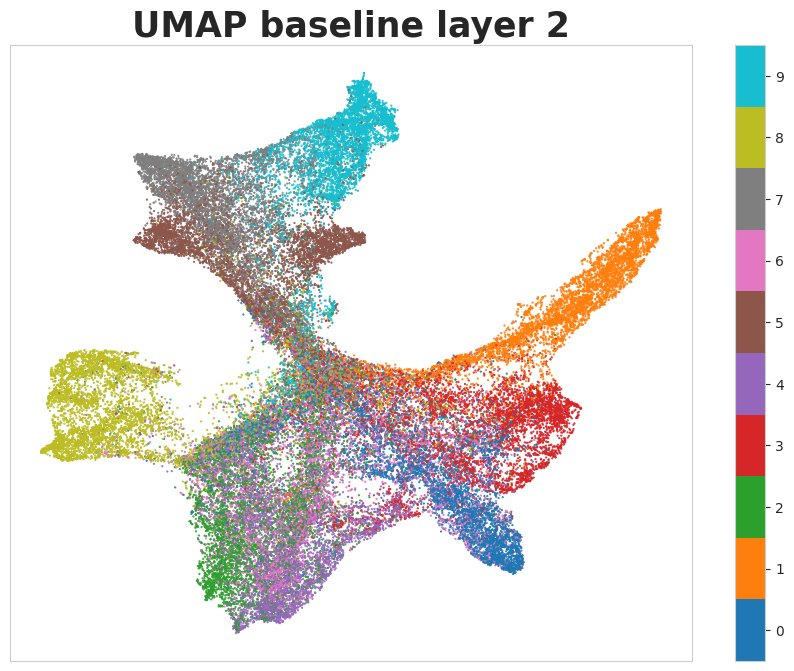

In [32]:
from matplotlib import pyplot as plt

import numpy as np
import umap

umap_hparams = {'n_neighbors':5,
                'min_dist':0.1,
                'n_components':2,
                'metric':'euclidean'}

for layer in range(3):
    actvs, labels = get_activations(layer, train_loader)
    actvs = actvs.view(actvs.shape[0], -1).detach().numpy()

    fig, ax = plt.subplots(figsize=(11,8), constrained_layout=False)
    ax.set(xticks=[], yticks=[])
    
    umap_embedding = umap.UMAP(n_neighbors=umap_hparams['n_neighbors'], min_dist=umap_hparams['min_dist'], n_components=umap_hparams['n_components'], metric=umap_hparams['metric']).fit_transform(actvs)
    scatter = ax.scatter(x = umap_embedding[:,0], y = umap_embedding[:,1], s=0.3, c=labels, cmap='tab10')
    
    cbar = plt.colorbar(scatter, boundaries=np.arange(11)-0.5)
    cbar.set_ticks(np.arange(10))
    cbar.set_ticklabels(np.arange(10))
    
    plt.title(f'UMAP baseline layer {layer}', fontsize=25, fontweight='bold')
    plt.show()

In [33]:
def get_activations_with_contrast_labels(layer, loader):
    all_activations = []
    labels = []
    for batch in tqdm(loader):
        x, _, contrast, _ = batch
        l, cache = hooked_cnn.run_with_cache(x)
        activations = cache[f'hks.adapt_{layer}_2']
        all_activations.append(activations)
        labels.append(contrast)
    return torch.cat(all_activations, dim=0), torch.cat(labels, dim=0)


100%|██████████| 1563/1563 [01:16<00:00, 20.34it/s]


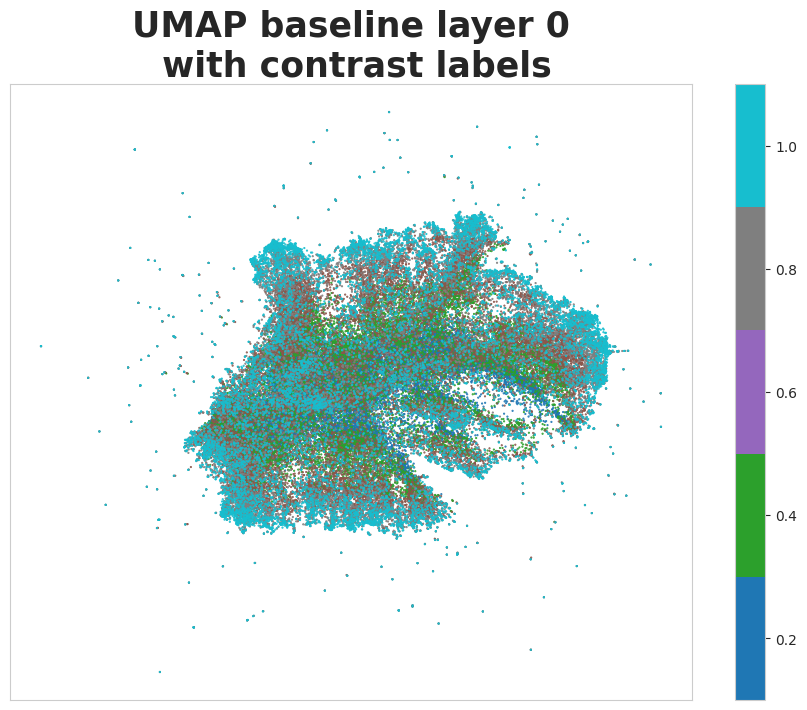


100%|██████████| 1563/1563 [01:04<00:00, 24.16it/s]


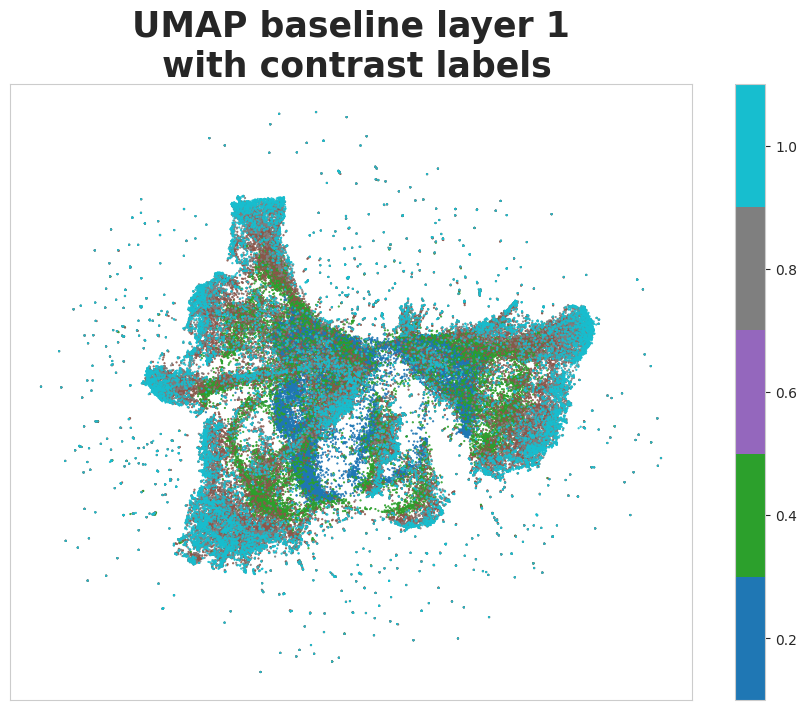


100%|██████████| 1563/1563 [00:59<00:00, 26.26it/s]


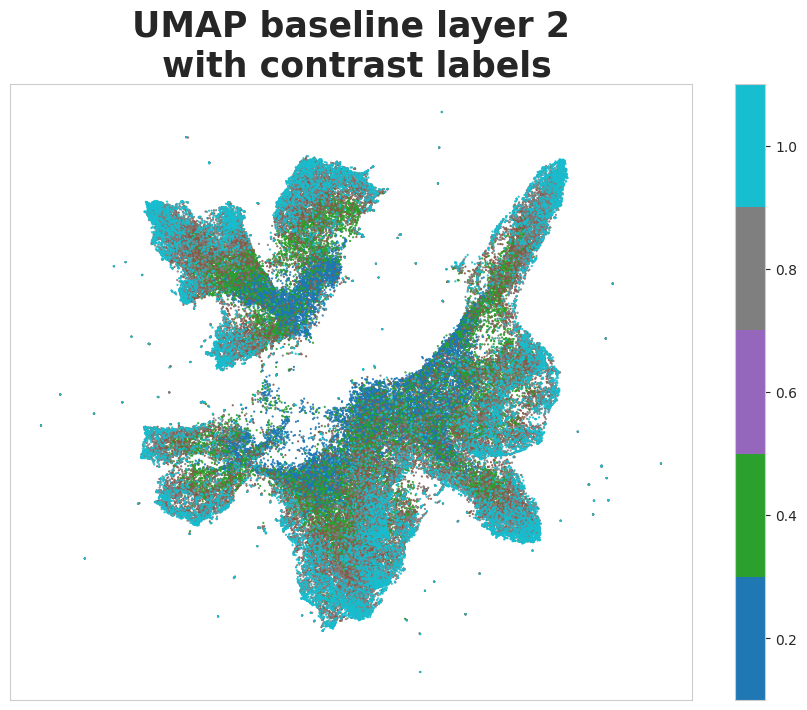


100%|██████████| 1563/1563 [01:29<00:00, 17.56it/s]


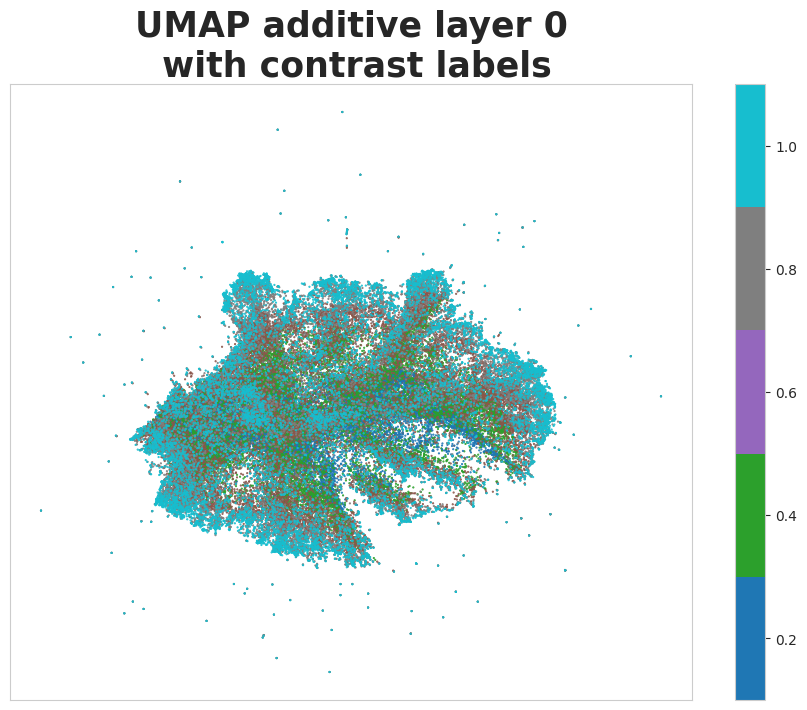


100%|██████████| 1563/1563 [01:05<00:00, 23.95it/s]


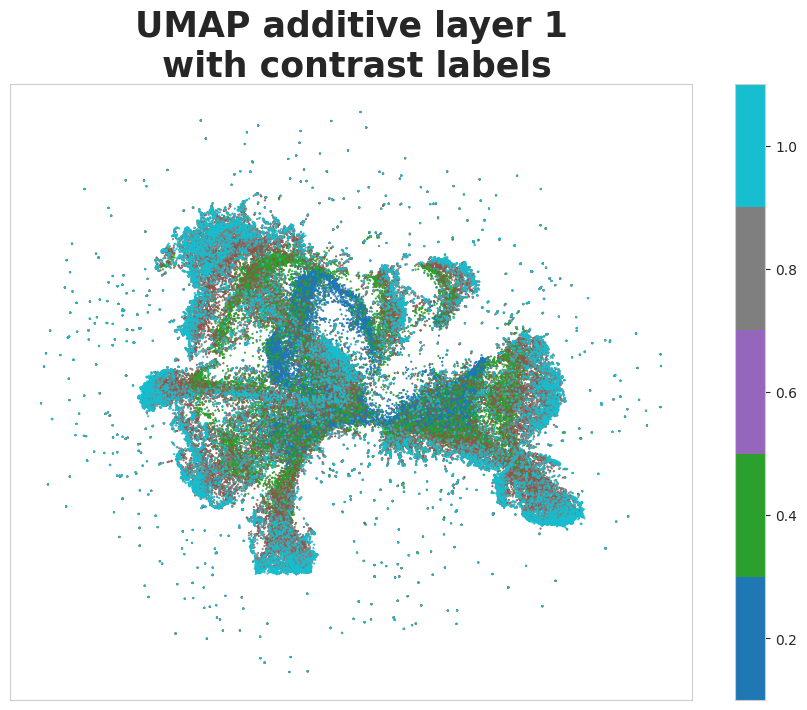


100%|██████████| 1563/1563 [00:58<00:00, 26.72it/s]


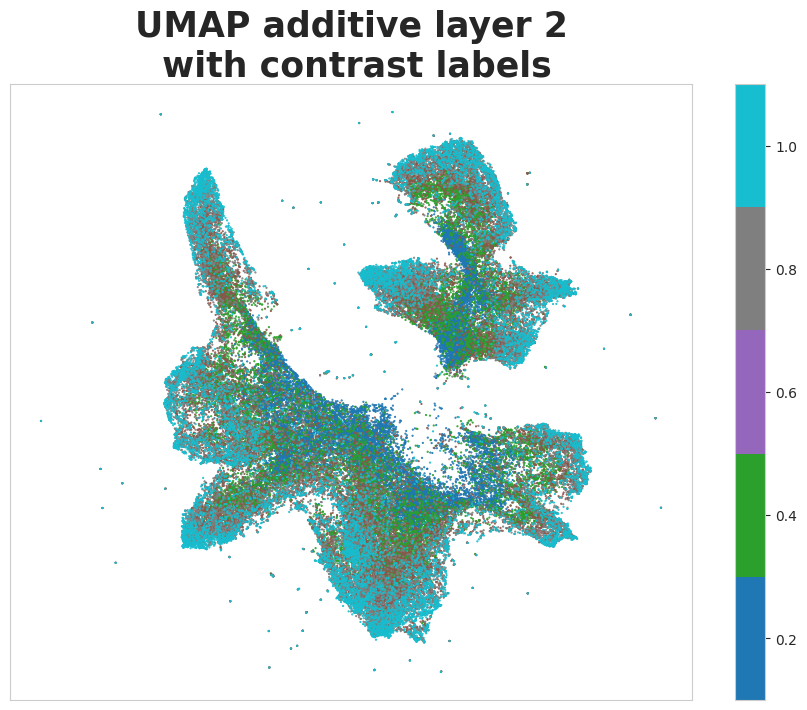


100%|██████████| 1563/1563 [01:27<00:00, 17.84it/s]


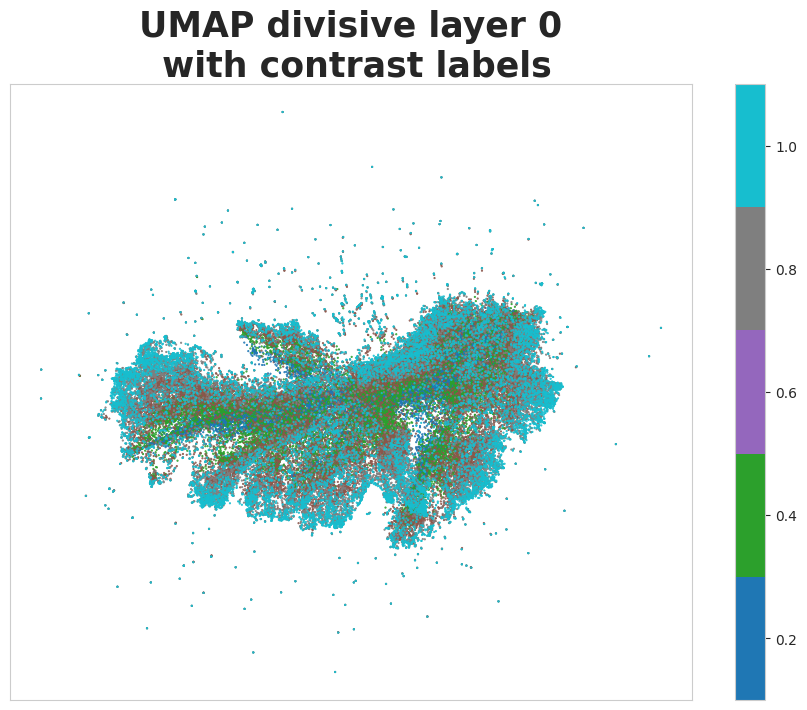


100%|██████████| 1563/1563 [01:04<00:00, 24.28it/s]


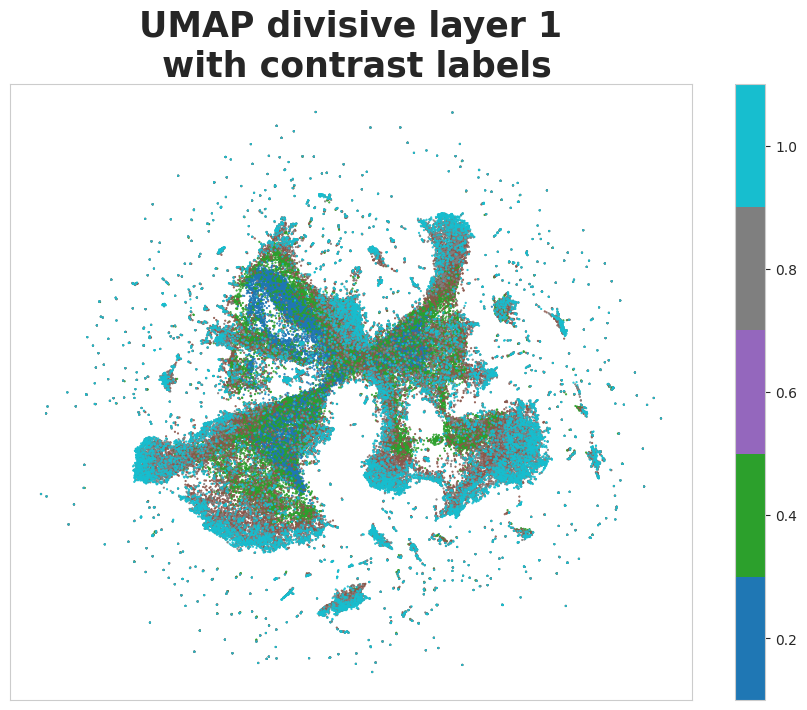


100%|██████████| 1563/1563 [00:59<00:00, 26.06it/s]


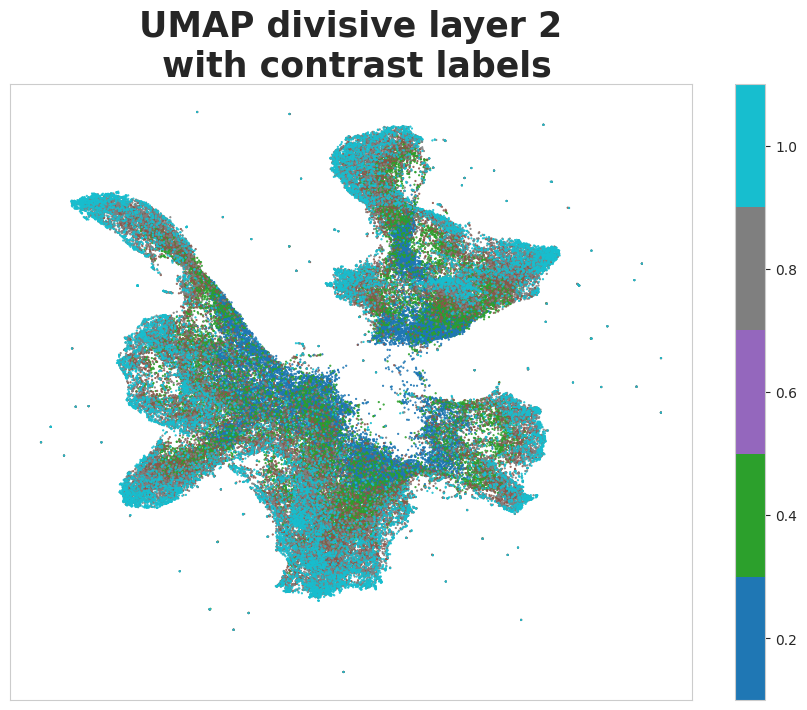

In [51]:
for name, model in models.items():
    for layer in range(3):
        actvs, labels = get_activations_with_contrast_labels(layer, test_loader)
        actvs = actvs.view(actvs.shape[0], -1).detach().numpy()
    
        fig, ax = plt.subplots(figsize=(11,8), constrained_layout=False)
        ax.set(xticks=[], yticks=[])
        
        umap_embedding = umap.UMAP(n_neighbors=umap_hparams['n_neighbors'], min_dist=umap_hparams['min_dist'], n_components=umap_hparams['n_components'], metric=umap_hparams['metric']).fit_transform(actvs)
        scatter = ax.scatter(x = umap_embedding[:,0], y = umap_embedding[:,1], s=0.3, c=labels, cmap='tab10')
        
        cbar = plt.colorbar(scatter, boundaries=[0.1, 0.3, 0.5, 0.7, 0.9, 1.1])
        cbar.set_ticks([0.2, 0.4, 0.6, 0.8, 1.0])
        cbar.set_ticklabels([0.2, 0.4, 0.6, 0.8, 1.0])
        
        plt.title(f'UMAP {name} layer {layer}\n with contrast labels', fontsize=25, fontweight='bold')
        plt.show()

In [1]:
additive_hooked_cnn = HookedRecursiveCNN(3, config['layer_kwargs_fmnist'], ExponentialDecay,
                                config['adaptation_kwargs_additive'])
additive_model = Adaptation.load_from_checkpoint(
    'learned_models/generalization_ExponentialDecay_contrast_random_repeat_noise_True_epoch_10.ckpt',
    model=additive_hooked_cnn)
wandb_logger = pl.loggers.WandbLogger(project='ai-thesis', config=config,
                                      name=f'del')
trainer = pl.Trainer(logger=wandb_logger)
trainer.test(model, test_loader)

In [61]:
test_dataset[40000]

(tensor([[[[0.0562, 0.2525, 0.0000,  ..., 0.1901, 0.5443, 0.1922],
           [0.1124, 0.0000, 0.3540,  ..., 0.3858, 0.2659, 0.5569],
           [0.2438, 0.4723, 0.0000,  ..., 0.3085, 0.1724, 0.0000],
           ...,
           [0.0510, 0.2790, 0.3885,  ..., 0.2946, 0.6410, 0.0000],
           [0.0000, 0.0000, 0.0148,  ..., 0.0000, 0.6624, 0.1695],
           [0.0000, 0.3775, 0.5919,  ..., 0.2749, 0.3978, 0.0000]]],
 
 
         [[[0.1673, 0.1673, 0.1673,  ..., 0.1673, 0.1673, 0.1673],
           [0.1673, 0.1673, 0.1673,  ..., 0.1673, 0.1673, 0.1673],
           [0.1673, 0.1673, 0.1673,  ..., 0.1673, 0.1673, 0.1673],
           ...,
           [0.1673, 0.1673, 0.1673,  ..., 0.1673, 0.1673, 0.1673],
           [0.1673, 0.1673, 0.1673,  ..., 0.1673, 0.1673, 0.1673],
           [0.1673, 0.1673, 0.1673,  ..., 0.1673, 0.1673, 0.1673]]],
 
 
         [[[0.0000, 0.0852, 0.0000,  ..., 0.0227, 0.3770, 0.0249],
           [0.0000, 0.0000, 0.1867,  ..., 0.2184, 0.0986, 0.3896],
           [0.0764

In [95]:
actvs.shape

torch.Size([1, 32, 24, 24])

In [149]:
actvs.shape

torch.Size([1, 32, 24, 24])

In [10]:
import torchvision

def actvs_grid(model, dataset, idx, layer):
    # subplots
    fig, axs = plt.subplots(1, 5, figsize=(27, 6))
    for i in [0, 10000, 20000, 30000, 40000]:
        l, cache = model.model.run_with_cache(dataset[i + idx][0].unsqueeze(0))
        actvs = cache[f'hks.adapt_{layer}_2']
        grid = torchvision.utils.make_grid(actvs.squeeze().unsqueeze(1), nrow=10, padding=0, normalize=True, scale_each=False)
        # put channel last
        grid = grid.permute(1, 2, 0)
        ax = axs[i // 10000]
        ax.imshow(grid)
        width = actvs.shape[-1]
        num_maps = actvs.shape[1]
        # put gridlines every 28 px
        ax.set_xticks(np.arange(0, width * 10, width))
        ax.set_yticks(np.arange(0, (num_maps // 10 + 1) * width, width))

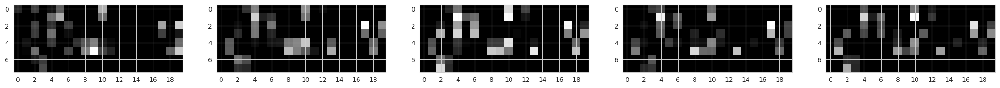

In [154]:
actvs_grid(models['baseline'], test_dataset, 1, 2)

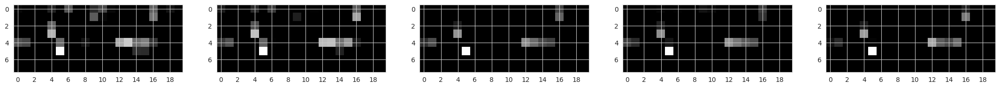

In [155]:
actvs_grid(models['additive'], test_dataset, 1, 2)

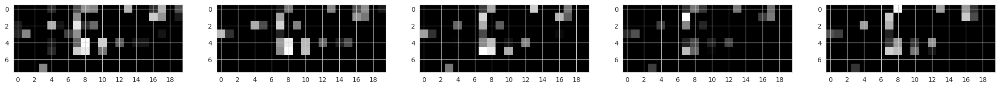

In [156]:
actvs_grid(models['divisive'], test_dataset, 1, 2)

# Train on 0.2, 1.0, test on rest

In [4]:
# load model
with open('config.json', 'r') as f:
    config = json.load(f)
hooked_cnn = HookedRecursiveCNN(3, config['layer_kwargs_fmnist'], ExponentialDecay, 
                                [
    {"alpha_init":  1.0, "train_alpha": False, "beta_init": 1, "train_beta": False},
    {"alpha_init":  1.0, "train_alpha": False, "beta_init": 1, "train_beta": False},
    {"alpha_init":  1.0, "train_alpha": False, "beta_init": 1, "train_beta": False},
    {"alpha_init":  1.0, "train_alpha": False, "beta_init": 1, "train_beta": False}
  ]
                                )
model = Adaptation.load_from_checkpoint(
    'learned_models/baseline_generalization_ExponentialDecay_contrast_[0.2, 1.0]_repeat_noise_True_epoch_10.ckpt', model=hooked_cnn)

models = {}
models['baseline'] = model

additive_hooked_cnn = HookedRecursiveCNN(3, config['layer_kwargs_fmnist'], ExponentialDecay,
                                config['adaptation_kwargs_additive'])
additive_model = Adaptation.load_from_checkpoint(
    'learned_models/generalization_ExponentialDecay_contrast_[0.2, 1.0]_repeat_noise_True_epoch_10.ckpt',
    model=additive_hooked_cnn)
models['additive'] = additive_model

divisive_hooked_cnn = HookedRecursiveCNN(3, config['layer_kwargs_fmnist'], DivisiveNorm,
                                config['adaptation_kwargs_div_norm'])
divisive_model = Adaptation.load_from_checkpoint(
    'learned_models/generalization_DivisiveNorm_contrast_[0.2, 1.0]_repeat_noise_True_epoch_10.ckpt',
    model=divisive_hooked_cnn)
models['divisive'] = divisive_model


wandb: Currently logged in as: georglange. Use `wandb login --relogin` to force relogin


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


baseline


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]


Testing: 0it [00:00, ?it/s]

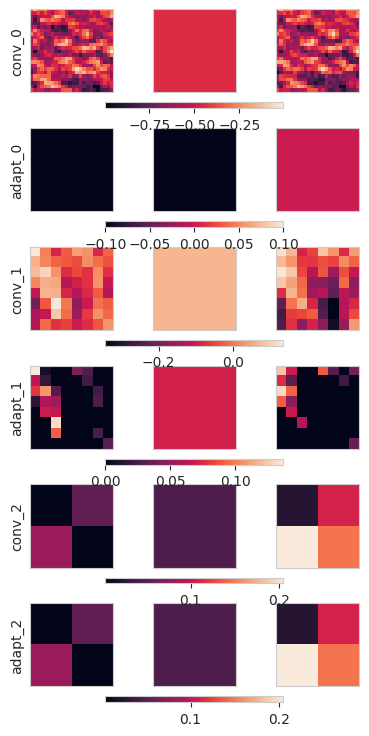

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.



┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       acc/0.2_False       │    0.6575000286102295     │
│       acc/0.2_True        │    0.6553000211715698     │
│       acc/0.4_False       │    0.7226999998092651     │
│       acc/0.4_True        │    0.7286999821662903     │
│       acc/0.6_False       │    0.7595000267028809     │
│       acc/0.6_True        │    0.7562000155448914     │
│       acc/0.8_False       │    0.7875000238418579     │
│       acc/0.8_True        │     0.785099983215332     │
│       acc/1.0_False       │    0.8050000071525574     │
│       acc/1.0_True        │    0.8062000274658203     │
│       acc_diff/0.2        │   -0.002199999988079071   │
│       acc_diff/0.4        │   0.006000000052154064    │
│       acc_diff/0.6        │  -0.0032999999821186066   │
│       acc_diff/0.8        │   -0.002400000113993883   │
│       acc_diff/1.0        │   0.0012000000569969416   │
│   cum_actv_diff/0.2_l0    │  -4.402125705382787e-05   │
│   cum_actv_diff/0.2_l1    │  -0.00016507921100128442  │
│   cum_actv_diff/0.2_l2    │  -2.5649613235145807e-05  │
│   cum_actv_diff/0.4_l0    │   5.756467089668149e-06   │
│   cum_actv_diff/0.4_l1    │  -5.571553629124537e-05   │
│   cum_actv_diff/0.4_l2    │  -6.578530155820772e-05   │
│   cum_actv_diff/0.6_l0    │  -7.514656772400485e-06   │
│   cum_actv_diff/0.6_l1    │  -2.833080907294061e-05   │
│   cum_actv_diff/0.6_l2    │  -1.9656625227071345e-05  │
│   cum_actv_diff/0.8_l0    │   3.715887578437105e-05   │
│   cum_actv_diff/0.8_l1    │  -4.662070296035381e-06   │
│   cum_actv_diff/0.8_l2    │  0.00011043184349546209   │
│   cum_actv_diff/1.0_l0    │   3.823471342911944e-05   │
│   cum_actv_diff/1.0_l1    │  0.00011349635315127671   │
│   cum_actv_diff/1.0_l2    │   9.085418423637748e-05   │
│         test_acc          │    0.7463700175285339     │
│         test_loss         │    0.6617342829704285     │
└───────────────────────────┴───────────────────────────┘

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]


additive


Testing: 0it [00:00, ?it/s]

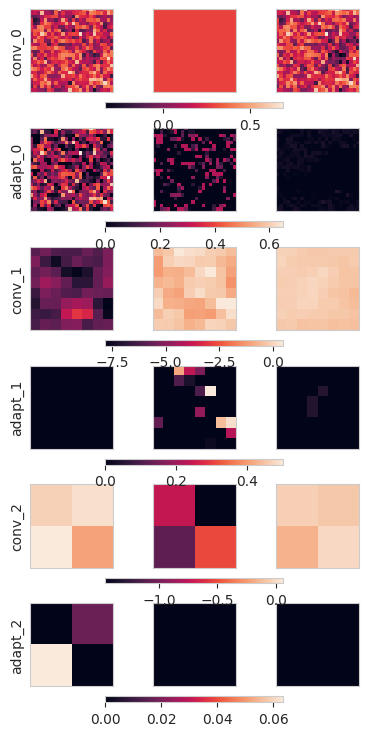

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.



┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       acc/0.2_False       │    0.1941000074148178     │
│       acc/0.2_True        │    0.8712000250816345     │
│       acc/0.4_False       │    0.33250001072883606    │
│       acc/0.4_True        │    0.8712000250816345     │
│       acc/0.6_False       │    0.4675000011920929     │
│       acc/0.6_True        │    0.8662999868392944     │
│       acc/0.8_False       │    0.5900999903678894     │
│       acc/0.8_True        │    0.8736000061035156     │
│       acc/1.0_False       │    0.6650999784469604     │
│       acc/1.0_True        │    0.8744999766349792     │
│       acc_diff/0.2        │    0.6771000027656555     │
│       acc_diff/0.4        │    0.5386999845504761     │
│       acc_diff/0.6        │    0.39879998564720154    │
│       acc_diff/0.8        │    0.28349998593330383    │
│       acc_diff/1.0        │    0.2093999981880188     │
│   cum_actv_diff/0.2_l0    │    0.04320629686117172    │
│   cum_actv_diff/0.2_l1    │  1.5836727470741607e-05   │
│   cum_actv_diff/0.2_l2    │   0.0022823780309408903   │
│   cum_actv_diff/0.4_l0    │   0.036464203149080276    │
│   cum_actv_diff/0.4_l1    │   -0.00464358925819397    │
│   cum_actv_diff/0.4_l2    │   -0.005381392780691385   │
│   cum_actv_diff/0.6_l0    │    0.03037225268781185    │
│   cum_actv_diff/0.6_l1    │   -0.007895094342529774   │
│   cum_actv_diff/0.6_l2    │   -0.011968506500124931   │
│   cum_actv_diff/0.8_l0    │    0.02528887242078781    │
│   cum_actv_diff/0.8_l1    │   -0.009485025890171528   │
│   cum_actv_diff/0.8_l2    │   -0.01602906920015812    │
│   cum_actv_diff/1.0_l0    │    0.02101142890751362    │
│   cum_actv_diff/1.0_l1    │   -0.00991789996623993    │
│   cum_actv_diff/1.0_l2    │   -0.017201818525791168   │
│         test_acc          │     0.660610020160675     │
│         test_loss         │    1.4131684303283691     │
└───────────────────────────┴───────────────────────────┘

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]


divisive


Testing: 0it [00:00, ?it/s]

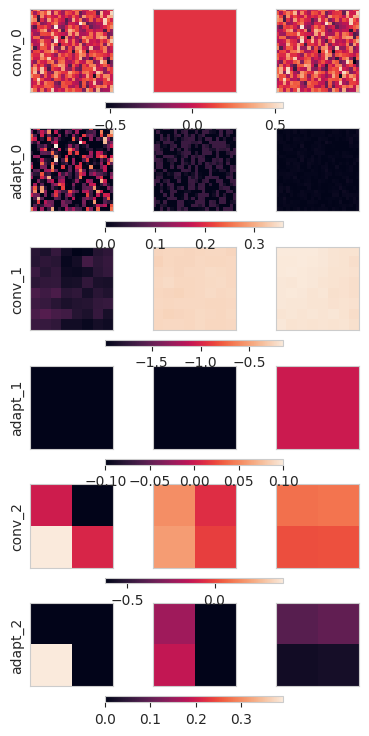

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.



┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       acc/0.2_False       │    0.2800000011920929     │
│       acc/0.2_True        │    0.8082000017166138     │
│       acc/0.4_False       │    0.4586000144481659     │
│       acc/0.4_True        │    0.8424999713897705     │
│       acc/0.6_False       │    0.6126999855041504     │
│       acc/0.6_True        │    0.8456000089645386     │
│       acc/0.8_False       │    0.7049000263214111     │
│       acc/0.8_True        │    0.8449000120162964     │
│       acc/1.0_False       │     0.757099986076355     │
│       acc/1.0_True        │    0.8485000133514404     │
│       acc_diff/0.2        │    0.5281999707221985     │
│       acc_diff/0.4        │     0.383899986743927     │
│       acc_diff/0.6        │    0.2328999936580658     │
│       acc_diff/0.8        │    0.14000000059604645    │
│       acc_diff/1.0        │    0.09139999747276306    │
│   cum_actv_diff/0.2_l0    │    0.01646076701581478    │
│   cum_actv_diff/0.2_l1    │   0.004535525105893612    │
│   cum_actv_diff/0.2_l2    │   -0.00903389137238264    │
│   cum_actv_diff/0.4_l0    │   0.015872158110141754    │
│   cum_actv_diff/0.4_l1    │   0.002855628961697221    │
│   cum_actv_diff/0.4_l2    │   -0.012177139520645142   │
│   cum_actv_diff/0.6_l0    │   0.014752425253391266    │
│   cum_actv_diff/0.6_l1    │   0.0010646088048815727   │
│   cum_actv_diff/0.6_l2    │   -0.011959102936089039   │
│   cum_actv_diff/0.8_l0    │   0.013542725704610348    │
│   cum_actv_diff/0.8_l1    │  -0.0001295083638979122   │
│   cum_actv_diff/0.8_l2    │   -0.01100686565041542    │
│   cum_actv_diff/1.0_l0    │   0.012153694406151772    │
│   cum_actv_diff/1.0_l1    │  -0.0008950203191488981   │
│   cum_actv_diff/1.0_l2    │   -0.009217231534421444   │
│         test_acc          │    0.7002999782562256     │
│         test_loss         │    1.0295220613479614     │
└───────────────────────────┴───────────────────────────┘

<Axes: xlabel='name', ylabel='test_acc'>

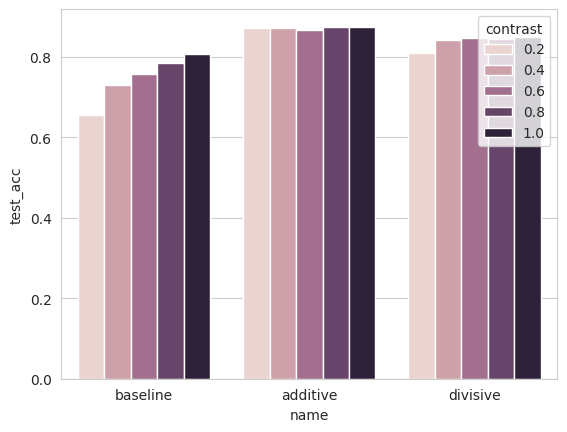

In [5]:
wandb_logger = pl.loggers.WandbLogger(project='ai-thesis', config=config,
                                                      name=f'del')
trainer = pl.Trainer(logger=wandb_logger)
results = {'name': [], 'test_acc': [], 'contrast': []}
for name, model in models.items():
    print(name)
    res = trainer.test(model, test_loader)
    for contrast in [0.2, 0.4, 0.6, 0.8, 1.0]:
        results['name'].append(name)
        results['test_acc'].append(res[0][f'acc/{contrast}_True'])
        results['contrast'].append(contrast)
    
import seaborn as sns

sns.barplot(x='name', y='test_acc', data=results, hue='contrast')

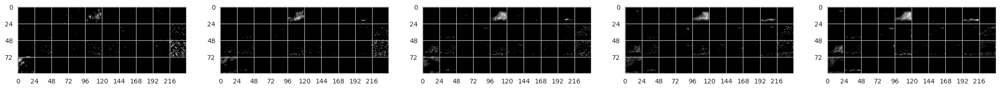

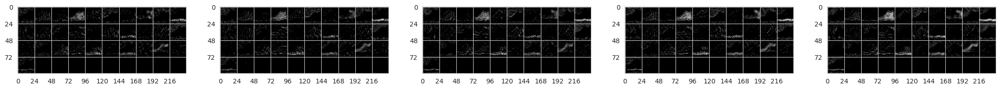

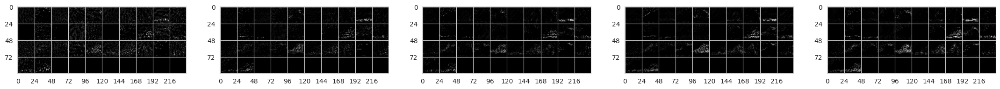

In [11]:
import matplotlib.pyplot as plt
import numpy as np

actvs_grid(models['baseline'], test_dataset, 0, 0)
plt.show()
actvs_grid(models['additive'], test_dataset, 0, 0)
plt.show()
actvs_grid(models['divisive'], test_dataset, 0, 0)

# Cifar-10

In [54]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


df = pd.read_csv('experimental_data/num_maps_cifar10_30ep/version_0/metrics.csv', delimiter=',')

In [55]:
df[['contrast', 'epoch', 'repeat_noise']] = df[['contrast', 'epoch', 'repeat_noise']].ffill()
df = df.dropna()

In [56]:
df.columns

Index(['contrast', 'epoch', 'repeat_noise', 'test_acc', 'step', 'num_maps',
       'adaptation_type', 'test_loss', 'acc/0.2_True', 'acc/0.2_False',
       'acc/0.4_True', 'acc/0.4_False', 'acc/0.6_True', 'acc/0.6_False',
       'acc/0.8_True', 'acc/0.8_False', 'acc/1.0_True', 'acc/1.0_False',
       'acc_diff/0.2', 'acc_diff/0.4', 'acc_diff/0.6', 'acc_diff/0.8',
       'acc_diff/1.0', 'cum_actv_diff/0.2_l0', 'cum_actv_diff/0.2_l1',
       'cum_actv_diff/0.2_l2', 'cum_actv_diff/0.4_l0', 'cum_actv_diff/0.4_l1',
       'cum_actv_diff/0.4_l2', 'cum_actv_diff/0.6_l0', 'cum_actv_diff/0.6_l1',
       'cum_actv_diff/0.6_l2', 'cum_actv_diff/0.8_l0', 'cum_actv_diff/0.8_l1',
       'cum_actv_diff/0.8_l2', 'cum_actv_diff/1.0_l0', 'cum_actv_diff/1.0_l1',
       'cum_actv_diff/1.0_l2'],
      dtype='object')

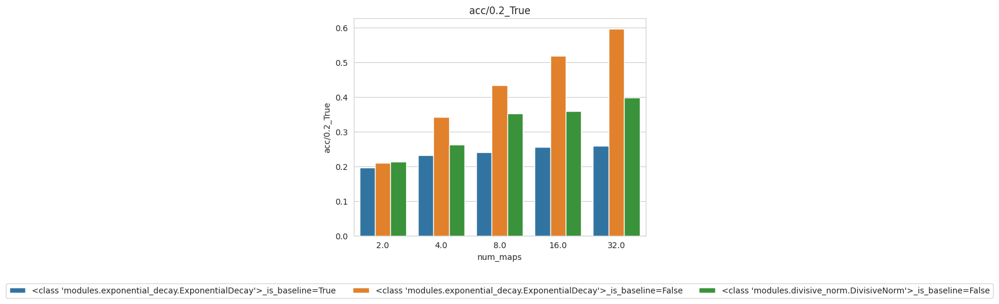

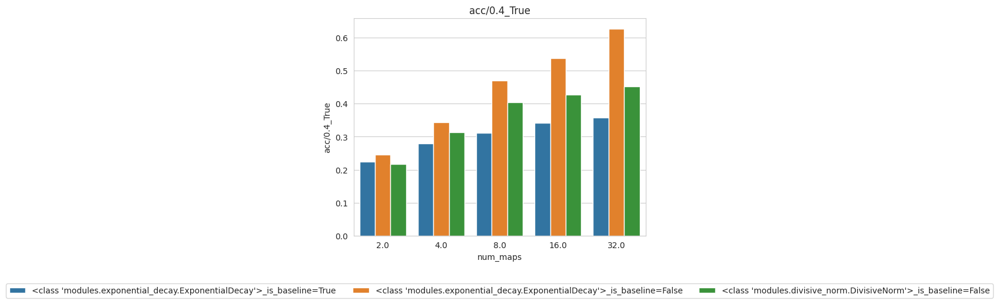

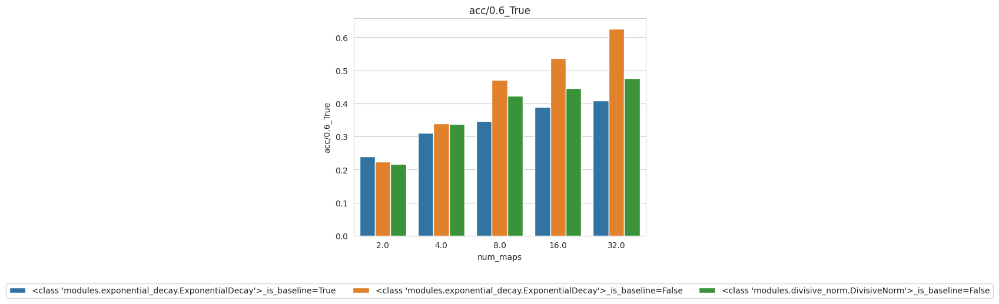

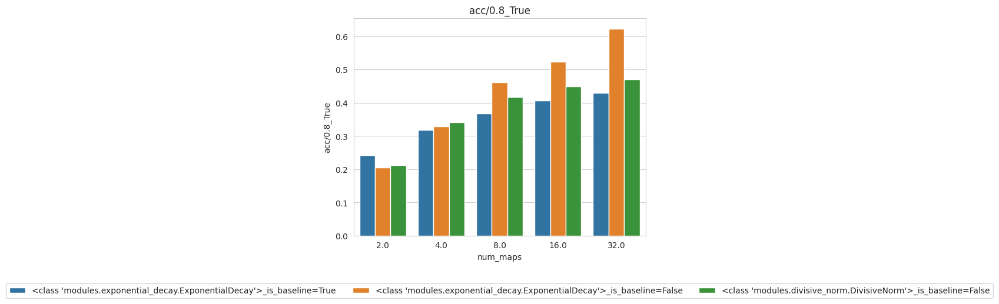

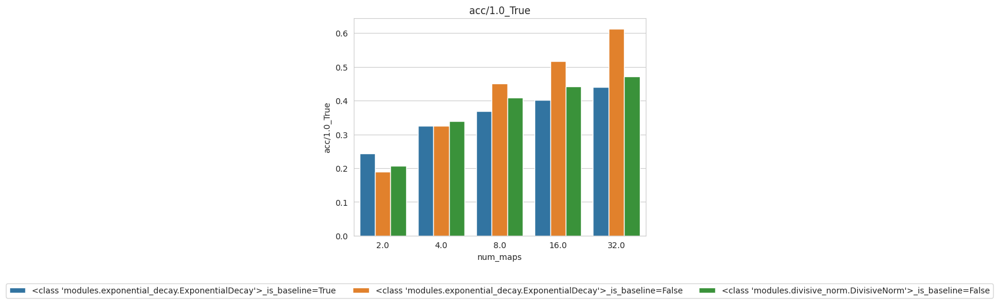

In [57]:
for acc in ['acc/0.2_True', 'acc/0.4_True', 'acc/0.6_True', 'acc/0.8_True', 'acc/1.0_True']:
    sns.barplot(data=df, x='num_maps', y=acc, hue='adaptation_type')
    # legend bottom
    plt.legend(bbox_to_anchor=(0.5, -0.2), loc='upper center', ncol=3)
    plt.title(acc)
    plt.show()

In [23]:
# load model
with open('config.json', 'r') as f:
    config = json.load(f)
hooked_cnn = HookedRecursiveCNN(3, config['layer_kwargs_cifar10'], ExponentialDecay, 
                                [
    {"alpha_init":  1.0, "train_alpha": False, "beta_init": 1, "train_beta": False},
    {"alpha_init":  1.0, "train_alpha": False, "beta_init": 1, "train_beta": False},
    {"alpha_init":  1.0, "train_alpha": False, "beta_init": 1, "train_beta": False},
    {"alpha_init":  1.0, "train_alpha": False, "beta_init": 1, "train_beta": False}
  ]
                                )
model = Adaptation.load_from_checkpoint(
    'learned_models/baseline_generalization_cifar_ExponentialDecay_contrast_[0.2, 1.0]_repeat_noise_True_epoch_20.ckpt', model=hooked_cnn)

models = {}
models['baseline'] = model

additive_hooked_cnn = HookedRecursiveCNN(3, config['layer_kwargs_cifar10'], ExponentialDecay,
                                config['adaptation_kwargs_additive'])
additive_model = Adaptation.load_from_checkpoint(
    'learned_models/generalization_cifar_ExponentialDecay_contrast_[0.2, 1.0]_repeat_noise_True_epoch_20.ckpt',
    model=additive_hooked_cnn)
models['additive'] = additive_model

divisive_hooked_cnn = HookedRecursiveCNN(3, config['layer_kwargs_cifar10'], DivisiveNorm,
                                config['adaptation_kwargs_div_norm'])
divisive_model = Adaptation.load_from_checkpoint(
    'learned_models/generalization_cifar_DivisiveNorm_contrast_[0.2, 1.0]_repeat_noise_True_epoch_20.ckpt',
    model=divisive_hooked_cnn)
models['divisive'] = divisive_model


In [28]:
train_loader, test_loader, train_dataset, test_dataset = get_dataloaders('cifar10')

Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Foun

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/pytorch_lightning/loggers/wandb.py:395: UserWarning: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.
  rank_zero_warn(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]


baseline


Testing: 0it [00:00, ?it/s]

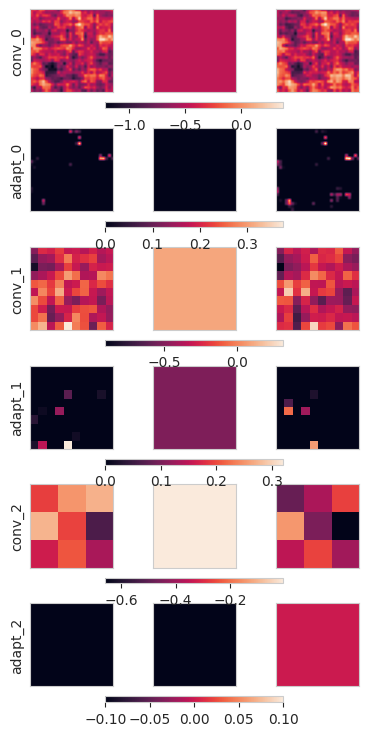

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.



┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       acc/0.2_False       │    0.27630001306533813    │
│       acc/0.2_True        │    0.2854999899864197     │
│       acc/0.4_False       │    0.38600000739097595    │
│       acc/0.4_True        │    0.3804999887943268     │
│       acc/0.6_False       │    0.4442000091075897     │
│       acc/0.6_True        │    0.4361000061035156     │
│       acc/0.8_False       │    0.47440001368522644    │
│       acc/0.8_True        │    0.4722000062465668     │
│       acc/1.0_False       │    0.4977000057697296     │
│       acc/1.0_True        │    0.4903999865055084     │
│       acc_diff/0.2        │   0.009200000204145908    │
│       acc_diff/0.4        │   -0.005499999970197678   │
│       acc_diff/0.6        │   -0.008100000210106373   │
│       acc_diff/0.8        │   -0.002199999988079071   │
│       acc_diff/1.0        │   -0.007300000172108412   │
│   cum_actv_diff/0.2_l0    │  -4.888400144409388e-05   │
│   cum_actv_diff/0.2_l1    │  -4.178252493147738e-05   │
│   cum_actv_diff/0.2_l2    │  -6.992672570049763e-05   │
│   cum_actv_diff/0.4_l0    │  -2.201843381044455e-05   │
│   cum_actv_diff/0.4_l1    │  -1.2209947271912824e-05  │
│   cum_actv_diff/0.4_l2    │  -3.484657281660475e-05   │
│   cum_actv_diff/0.6_l0    │  -2.403958433205844e-06   │
│   cum_actv_diff/0.6_l1    │   4.980974154022988e-06   │
│   cum_actv_diff/0.6_l2    │   7.462012035830412e-06   │
│   cum_actv_diff/0.8_l0    │  1.6212834452744573e-05   │
│   cum_actv_diff/0.8_l1    │  2.2559681383427233e-05   │
│   cum_actv_diff/0.8_l2    │  0.00011718383029801771   │
│   cum_actv_diff/1.0_l0    │   7.180536340456456e-05   │
│   cum_actv_diff/1.0_l1    │   6.863733869977295e-05   │
│   cum_actv_diff/1.0_l2    │   8.716839511180297e-05   │
│         test_acc          │    0.41433000564575195    │
│         test_loss         │     1.632826566696167     │
└───────────────────────────┴───────────────────────────┘

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]


additive


Testing: 0it [00:00, ?it/s]

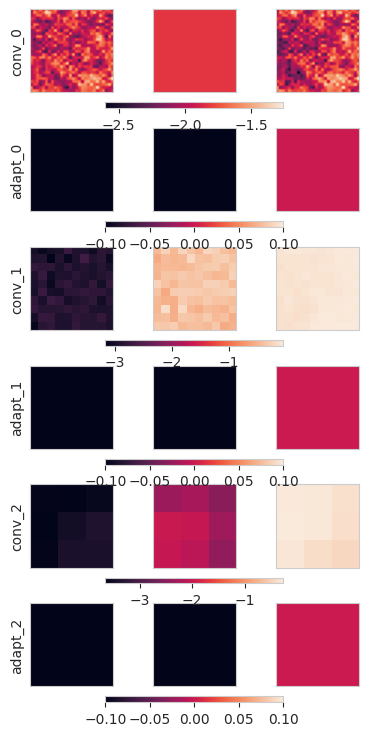

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.



┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       acc/0.2_False       │    0.10840000212192535    │
│       acc/0.2_True        │    0.6298999786376953     │
│       acc/0.4_False       │    0.11270000040531158    │
│       acc/0.4_True        │    0.6182000041007996     │
│       acc/0.6_False       │    0.12530000507831573    │
│       acc/0.6_True        │    0.6177999973297119     │
│       acc/0.8_False       │    0.14920000731945038    │
│       acc/0.8_True        │    0.6401000022888184     │
│       acc/1.0_False       │    0.1754000037908554     │
│       acc/1.0_True        │    0.6455000042915344     │
│       acc_diff/0.2        │    0.5214999914169312     │
│       acc_diff/0.4        │    0.5055000185966492     │
│       acc_diff/0.6        │    0.4925000071525574     │
│       acc_diff/0.8        │    0.4909000098705292     │
│       acc_diff/1.0        │    0.4700999855995178     │
│   cum_actv_diff/0.2_l0    │    0.05964420363306999    │
│   cum_actv_diff/0.2_l1    │   0.021395592018961906    │
│   cum_actv_diff/0.2_l2    │  -0.0027606068179011345   │
│   cum_actv_diff/0.4_l0    │    0.05545321851968765    │
│   cum_actv_diff/0.4_l1    │   0.019387701526284218    │
│   cum_actv_diff/0.4_l2    │  -0.0023105402942746878   │
│   cum_actv_diff/0.6_l0    │    0.05056757479906082    │
│   cum_actv_diff/0.6_l1    │   0.016035867854952812    │
│   cum_actv_diff/0.6_l2    │   -0.002284420421347022   │
│   cum_actv_diff/0.8_l0    │    0.04601670801639557    │
│   cum_actv_diff/0.8_l1    │   0.012635092251002789    │
│   cum_actv_diff/0.8_l2    │  -0.0018133553676307201   │
│   cum_actv_diff/1.0_l0    │    0.04166392236948013    │
│   cum_actv_diff/1.0_l1    │    0.00939538050442934    │
│   cum_actv_diff/1.0_l2    │  -0.0006121414480730891   │
│         test_acc          │    0.38225001096725464    │
│         test_loss         │     2.65622878074646      │
└───────────────────────────┴───────────────────────────┘

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]


divisive


Testing: 0it [00:00, ?it/s]

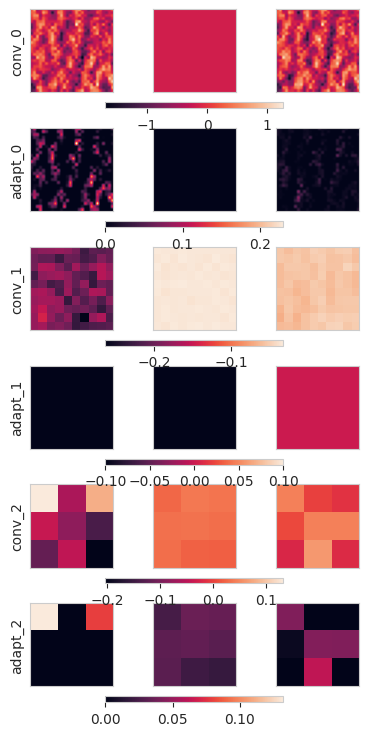

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.



┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       acc/0.2_False       │    0.22010000050067902    │
│       acc/0.2_True        │    0.43639999628067017    │
│       acc/0.4_False       │    0.29420000314712524    │
│       acc/0.4_True        │    0.4697999954223633     │
│       acc/0.6_False       │    0.3463999927043915     │
│       acc/0.6_True        │    0.5005000233650208     │
│       acc/0.8_False       │    0.3896999955177307     │
│       acc/0.8_True        │     0.517300009727478     │
│       acc/1.0_False       │    0.4156000018119812     │
│       acc/1.0_True        │    0.5295000076293945     │
│       acc_diff/0.2        │    0.21629999577999115    │
│       acc_diff/0.4        │    0.17560000717639923    │
│       acc_diff/0.6        │    0.15410000085830688    │
│       acc_diff/0.8        │    0.12759999930858612    │
│       acc_diff/1.0        │    0.11389999836683273    │
│   cum_actv_diff/0.2_l0    │   0.004142851568758488    │
│   cum_actv_diff/0.2_l1    │   0.006855628453195095    │
│   cum_actv_diff/0.2_l2    │   0.0014984047738835216   │
│   cum_actv_diff/0.4_l0    │   0.0041098385117948055   │
│   cum_actv_diff/0.4_l1    │    0.00637165317311883    │
│   cum_actv_diff/0.4_l2    │   0.0030470271594822407   │
│   cum_actv_diff/0.6_l0    │   0.003964316565543413    │
│   cum_actv_diff/0.6_l1    │   0.005840471480041742    │
│   cum_actv_diff/0.6_l2    │   0.003269641660153866    │
│   cum_actv_diff/0.8_l0    │   0.0038183925207704306   │
│   cum_actv_diff/0.8_l1    │   0.0054140700958669186   │
│   cum_actv_diff/0.8_l2    │   0.003390304045751691    │
│   cum_actv_diff/1.0_l0    │   0.0036273289006203413   │
│   cum_actv_diff/1.0_l1    │   0.004980448167771101    │
│   cum_actv_diff/1.0_l2    │   0.0032826035749167204   │
│         test_acc          │    0.4119499921798706     │
│         test_loss         │     1.693347692489624     │
└───────────────────────────┴───────────────────────────┘

<Axes: xlabel='name', ylabel='test_acc'>

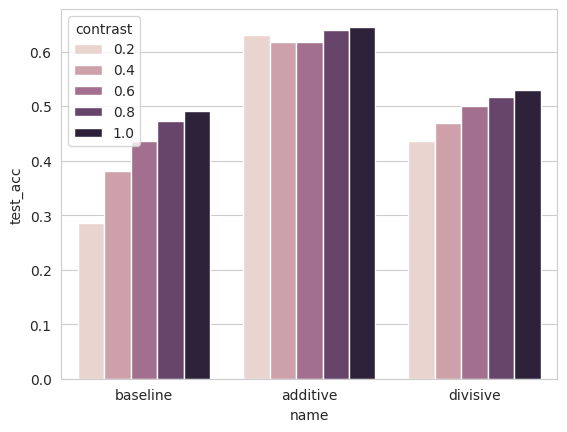

In [29]:
wandb_logger = pl.loggers.WandbLogger(project='ai-thesis', config=config,
                                                      name=f'del')
trainer = pl.Trainer(logger=wandb_logger)
results = {'name': [], 'test_acc': [], 'contrast': []}
for name, model in models.items():
    print(name)
    res = trainer.test(model, test_loader)
    for contrast in [0.2, 0.4, 0.6, 0.8, 1.0]:
        results['name'].append(name)
        results['test_acc'].append(res[0][f'acc/{contrast}_True'])
        results['contrast'].append(contrast)
    
import seaborn as sns

sns.barplot(x='name', y='test_acc', data=results, hue='contrast')

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]


baseline


Testing: 0it [00:00, ?it/s]

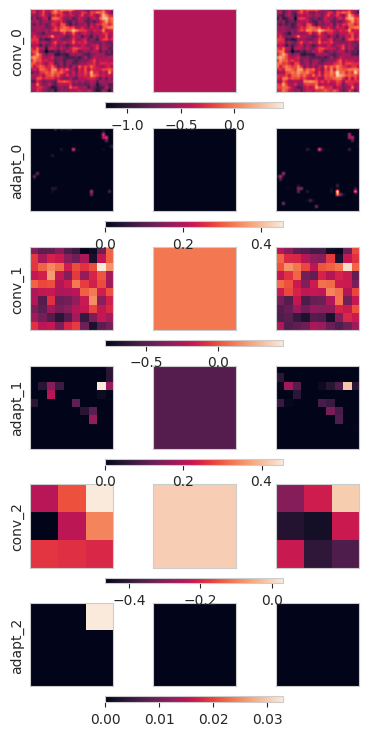

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.



┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       acc/0.2_False       │    0.2761000096797943     │
│       acc/0.2_True        │    0.2824000120162964     │
│       acc/0.4_False       │    0.3812499940395355     │
│       acc/0.4_True        │    0.3804500102996826     │
│       acc/0.6_False       │    0.43924999237060547    │
│       acc/0.6_True        │    0.4378499984741211     │
│       acc/0.8_False       │    0.4731000065803528     │
│       acc/0.8_True        │    0.4699999988079071     │
│       acc/1.0_False       │    0.4964999854564667     │
│       acc/1.0_True        │    0.49265000224113464    │
│       acc_diff/0.2        │   0.006300000008195639    │
│       acc_diff/0.4        │  -0.0007999999797903001   │
│       acc_diff/0.6        │   -0.00139999995008111    │
│       acc_diff/0.8        │   -0.003100000089034438   │
│       acc_diff/1.0        │  -0.0038499999791383743   │
│   cum_actv_diff/0.2_l0    │  -4.4275519030634314e-05  │
│   cum_actv_diff/0.2_l1    │  -4.4091622839914635e-05  │
│   cum_actv_diff/0.2_l2    │  -0.00010792749526444823  │
│   cum_actv_diff/0.4_l0    │  -1.2299460649956018e-05  │
│   cum_actv_diff/0.4_l1    │  -1.528017128293868e-05   │
│   cum_actv_diff/0.4_l2    │  1.3390585991146509e-06   │
│   cum_actv_diff/0.6_l0    │  -1.940819629453472e-06   │
│   cum_actv_diff/0.6_l1    │  1.2994268217880744e-05   │
│   cum_actv_diff/0.6_l2    │  -3.133289283141494e-05   │
│   cum_actv_diff/0.8_l0    │   3.160253254463896e-05   │
│   cum_actv_diff/0.8_l1    │  3.7870955566177145e-05   │
│   cum_actv_diff/0.8_l2    │  0.00011866327258758247   │
│   cum_actv_diff/1.0_l0    │  5.4227908549364656e-05   │
│   cum_actv_diff/1.0_l1    │   7.128867582650855e-05   │
│   cum_actv_diff/1.0_l2    │  0.00010925206879619509   │
│         test_acc          │    0.41157999634742737    │
│         test_loss         │    1.6351923942565918     │
└───────────────────────────┴───────────────────────────┘

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]


additive


Testing: 0it [00:00, ?it/s]

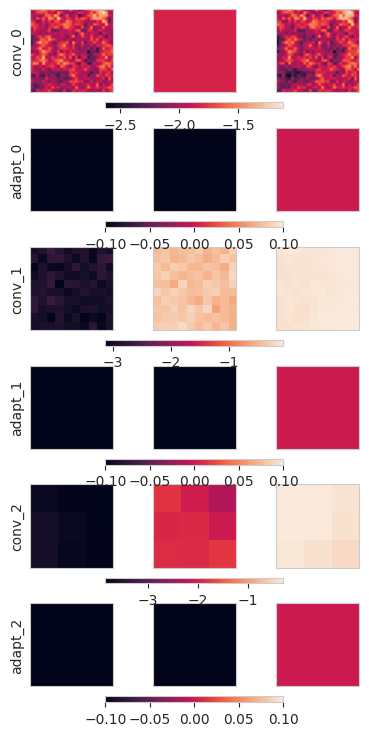

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.



┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       acc/0.2_False       │    0.10769999772310257    │
│       acc/0.2_True        │    0.6261500120162964     │
│       acc/0.4_False       │    0.11339999735355377    │
│       acc/0.4_True        │    0.6162499785423279     │
│       acc/0.6_False       │    0.1278499960899353     │
│       acc/0.6_True        │    0.6191499829292297     │
│       acc/0.8_False       │    0.14900000393390656    │
│       acc/0.8_True        │    0.6387500166893005     │
│       acc/1.0_False       │    0.17464999854564667    │
│       acc/1.0_True        │    0.6441500186920166     │
│       acc_diff/0.2        │    0.5184500217437744     │
│       acc_diff/0.4        │    0.5028499960899353     │
│       acc_diff/0.6        │    0.49129998683929443    │
│       acc_diff/0.8        │    0.4897499978542328     │
│       acc_diff/1.0        │    0.46950000524520874    │
│   cum_actv_diff/0.2_l0    │   0.059658490121364594    │
│   cum_actv_diff/0.2_l1    │   0.021394193172454834    │
│   cum_actv_diff/0.2_l2    │  -0.0027642014902085066   │
│   cum_actv_diff/0.4_l0    │    0.05546171963214874    │
│   cum_actv_diff/0.4_l1    │   0.019406022503972054    │
│   cum_actv_diff/0.4_l2    │   -0.002309298375621438   │
│   cum_actv_diff/0.6_l0    │    0.05056840181350708    │
│   cum_actv_diff/0.6_l1    │   0.016031824052333832    │
│   cum_actv_diff/0.6_l2    │  -0.0022489922121167183   │
│   cum_actv_diff/0.8_l0    │    0.04602259397506714    │
│   cum_actv_diff/0.8_l1    │   0.012633542530238628    │
│   cum_actv_diff/0.8_l2    │  -0.0017038468504324555   │
│   cum_actv_diff/1.0_l0    │    0.04165871813893318    │
│   cum_actv_diff/1.0_l1    │   0.009348379448056221    │
│   cum_actv_diff/1.0_l2    │  -0.0007113775936886668   │
│         test_acc          │    0.3811599910259247     │
│         test_loss         │    2.6589319705963135     │
└───────────────────────────┴───────────────────────────┘

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]


divisive


Testing: 0it [00:00, ?it/s]

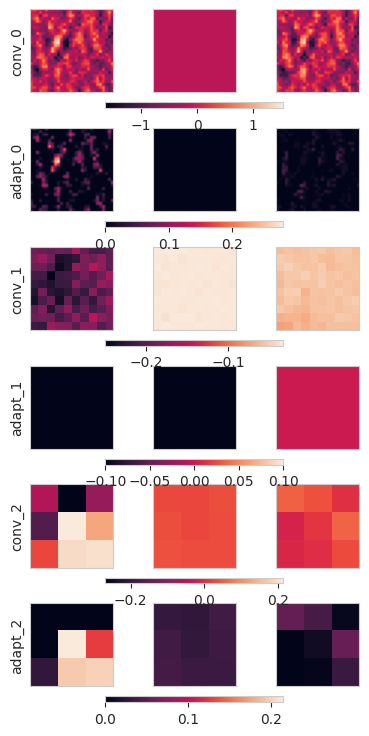

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.



┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       acc/0.2_False       │    0.2194499969482422     │
│       acc/0.2_True        │    0.4364500045776367     │
│       acc/0.4_False       │    0.29394999146461487    │
│       acc/0.4_True        │    0.47005000710487366    │
│       acc/0.6_False       │    0.34439998865127563    │
│       acc/0.6_True        │    0.5002999901771545     │
│       acc/0.8_False       │     0.388949990272522     │
│       acc/0.8_True        │     0.521049976348877     │
│       acc/1.0_False       │    0.41885000467300415    │
│       acc/1.0_True        │    0.5317500233650208     │
│       acc_diff/0.2        │    0.21699999272823334    │
│       acc_diff/0.4        │    0.1761000007390976     │
│       acc_diff/0.6        │    0.1559000015258789     │
│       acc_diff/0.8        │    0.13210000097751617    │
│       acc_diff/1.0        │    0.11289999634027481    │
│   cum_actv_diff/0.2_l0    │   0.0041450331918895245   │
│   cum_actv_diff/0.2_l1    │   0.006859665736556053    │
│   cum_actv_diff/0.2_l2    │   0.0015011028153821826   │
│   cum_actv_diff/0.4_l0    │   0.004105135798454285    │
│   cum_actv_diff/0.4_l1    │   0.006361319683492184    │
│   cum_actv_diff/0.4_l2    │    0.00302523304708302    │
│   cum_actv_diff/0.6_l0    │   0.003966336604207754    │
│   cum_actv_diff/0.6_l1    │   0.005846886895596981    │
│   cum_actv_diff/0.6_l2    │    0.00328302220441401    │
│   cum_actv_diff/0.8_l0    │   0.003815806470811367    │
│   cum_actv_diff/0.8_l1    │   0.005414406303316355    │
│   cum_actv_diff/0.8_l2    │   0.0033533915411680937   │
│   cum_actv_diff/1.0_l0    │   0.003629871178418398    │
│   cum_actv_diff/1.0_l1    │   0.004986971616744995    │
│   cum_actv_diff/1.0_l2    │   0.003329644212499261    │
│         test_acc          │    0.4130899906158447     │
│         test_loss         │    1.6915806531906128     │
└───────────────────────────┴───────────────────────────┘

<Axes: xlabel='name', ylabel='test_acc'>

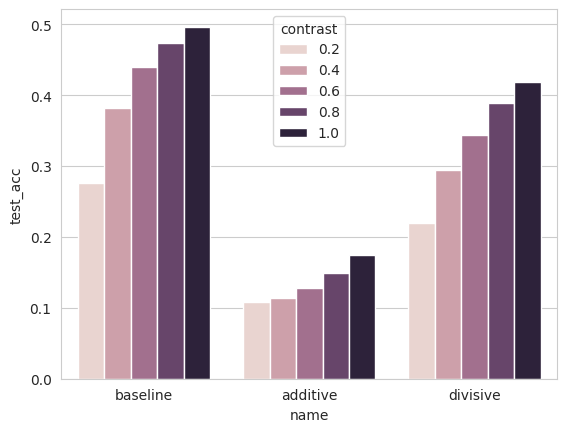

In [30]:
results = {'name': [], 'test_acc': [], 'contrast': []}
for name, model in models.items():
    print(name)
    res = trainer.test(model, test_loader)
    for contrast in [0.2, 0.4, 0.6, 0.8, 1.0]:
        results['name'].append(name)
        results['test_acc'].append(res[0][f'acc/{contrast}_False'])
        results['contrast'].append(contrast)
    
import seaborn as sns

sns.barplot(x='name', y='test_acc', data=results, hue='contrast')

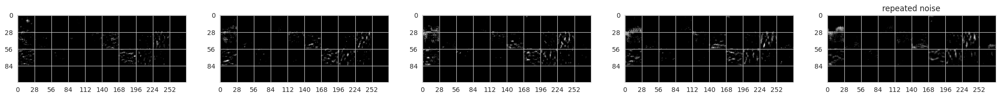

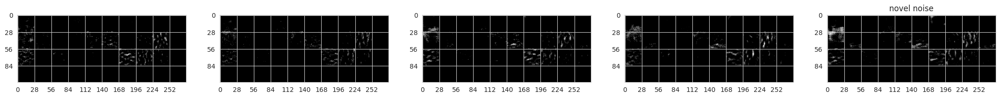

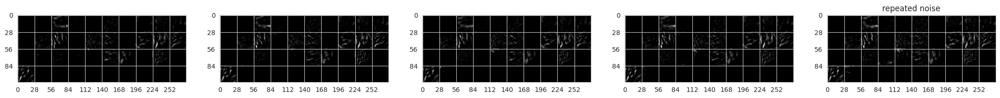

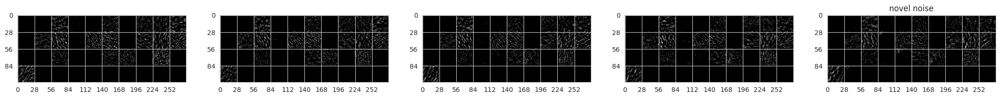

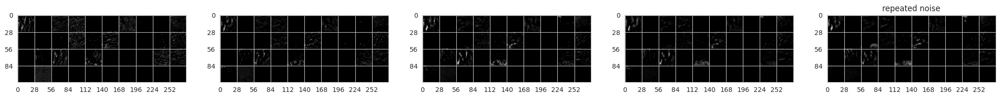

Text(0.5, 1.0, 'novel noise')

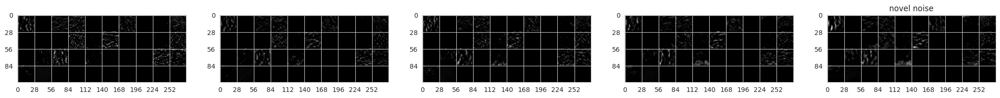

In [39]:
import matplotlib.pyplot as plt
import numpy as np
layer = 0
idx = 0
actvs_grid(models['baseline'], test_dataset, idx, layer)
plt.title('repeated noise')
plt.show()
actvs_grid(models['baseline'], test_dataset, idx + 50000, layer)
plt.title('novel noise')
plt.show()
actvs_grid(models['additive'], test_dataset, idx, layer)
plt.title('repeated noise')
plt.show()
actvs_grid(models['additive'], test_dataset, idx + 50000, layer)
plt.title('novel noise')
plt.show()
actvs_grid(models['divisive'], test_dataset, idx, layer)
plt.title('repeated noise')
plt.show()
actvs_grid(models['divisive'], test_dataset, idx + 50000, layer)
plt.title('novel noise')

In [43]:
test_dataset[0][0].shape

torch.Size([3, 3, 32, 32])

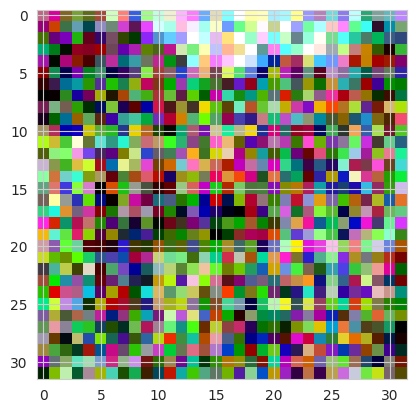

In [48]:
plt.imshow(test_dataset[49999][0][2].permute(1, 2, 0))

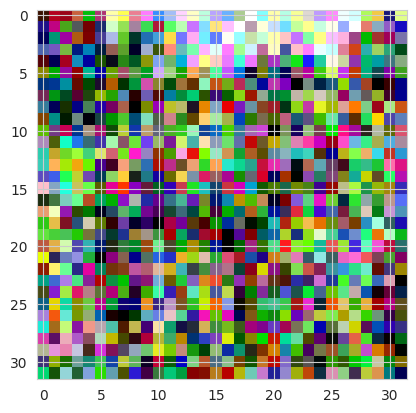

In [49]:
plt.imshow(test_dataset[49999 + 50000][0][2].permute(1, 2, 0))


# Trained on maximum contrast

In [4]:
# load model
with open('config.json', 'r') as f:
    config = json.load(f)
hooked_cnn = HookedRecursiveCNN(3, config['layer_kwargs_cifar10'], ExponentialDecay, 
                                [
    {"alpha_init":  1.0, "train_alpha": False, "beta_init": 1, "train_beta": False},
    {"alpha_init":  1.0, "train_alpha": False, "beta_init": 1, "train_beta": False},
    {"alpha_init":  1.0, "train_alpha": False, "beta_init": 1, "train_beta": False},
    {"alpha_init":  1.0, "train_alpha": False, "beta_init": 1, "train_beta": False}
  ]
                                )
model = Adaptation.load_from_checkpoint(
    'learned_models/baseline_generalization_cifar_ExponentialDecay_contrast_1.0_repeat_noise_True_epoch_20.ckpt', model=hooked_cnn)

models = {}
models['baseline'] = model

additive_hooked_cnn = HookedRecursiveCNN(3, config['layer_kwargs_cifar10'], ExponentialDecay,
                                config['adaptation_kwargs_additive'])
additive_model = Adaptation.load_from_checkpoint(
    'learned_models/generalization_cifar_ExponentialDecay_contrast_1.0_repeat_noise_True_epoch_20.ckpt',
    model=additive_hooked_cnn)
models['additive'] = additive_model

divisive_hooked_cnn = HookedRecursiveCNN(3, config['layer_kwargs_cifar10'], DivisiveNorm,
                                config['adaptation_kwargs_div_norm'])
divisive_model = Adaptation.load_from_checkpoint(
    'learned_models/generalization_cifar_DivisiveNorm_contrast_1.0_repeat_noise_True_epoch_20.ckpt',
    model=divisive_hooked_cnn)
models['divisive'] = divisive_model


Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Foun

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


baseline


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]


Testing: 0it [00:00, ?it/s]

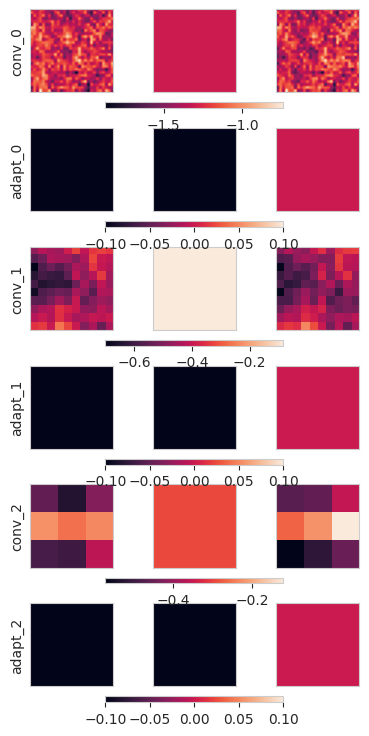

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.



┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       acc/0.2_False       │    0.18219999969005585    │
│       acc/0.2_True        │    0.17739999294281006    │
│       acc/0.4_False       │    0.2824999988079071     │
│       acc/0.4_True        │    0.28049999475479126    │
│       acc/0.6_False       │    0.3991999924182892     │
│       acc/0.6_True        │    0.3986000120639801     │
│       acc/0.8_False       │    0.4977000057697296     │
│       acc/0.8_True        │    0.5037000179290771     │
│       acc/1.0_False       │    0.5404000282287598     │
│       acc/1.0_True        │    0.5436999797821045     │
│       acc_diff/0.2        │   -0.004800000227987766   │
│       acc_diff/0.4        │  -0.0020000000949949026   │
│       acc_diff/0.6        │  -0.0006000000284984708   │
│       acc_diff/0.8        │   0.006000000052154064    │
│       acc_diff/1.0        │   0.0032999999821186066   │
│   cum_actv_diff/0.2_l0    │  -3.1672039767727256e-05  │
│   cum_actv_diff/0.2_l1    │  -9.472714009461924e-05   │
│   cum_actv_diff/0.2_l2    │  -0.00016404941561631858  │
│   cum_actv_diff/0.4_l0    │  -5.417336069513112e-06   │
│   cum_actv_diff/0.4_l1    │  -4.838299719267525e-05   │
│   cum_actv_diff/0.4_l2    │   9.253543248632923e-05   │
│   cum_actv_diff/0.6_l0    │  -1.3542100532504264e-05  │
│   cum_actv_diff/0.6_l1    │  -3.753273267648183e-05   │
│   cum_actv_diff/0.6_l2    │  3.5534998460207134e-05   │
│   cum_actv_diff/0.8_l0    │   3.718895823112689e-05   │
│   cum_actv_diff/0.8_l1    │   2.737446266110055e-05   │
│   cum_actv_diff/0.8_l2    │  2.2593914764001966e-05   │
│   cum_actv_diff/1.0_l0    │   5.147585034137592e-05   │
│   cum_actv_diff/1.0_l1    │   4.138630538363941e-05   │
│   cum_actv_diff/1.0_l2    │  0.00016541693184990436   │
│         test_acc          │    0.3805899918079376     │
│         test_loss         │     1.826108694076538     │
└───────────────────────────┴───────────────────────────┘

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]


additive


Testing: 0it [00:00, ?it/s]

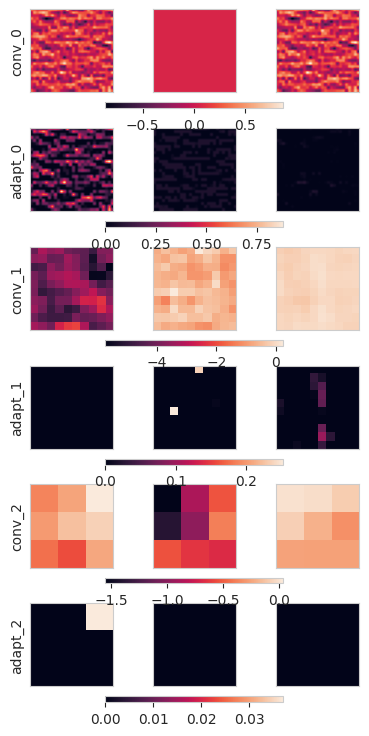

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.



┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       acc/0.2_False       │    0.16869999468326569    │
│       acc/0.2_True        │    0.15839999914169312    │
│       acc/0.4_False       │    0.20239999890327454    │
│       acc/0.4_True        │    0.32199999690055847    │
│       acc/0.6_False       │    0.23029999434947968    │
│       acc/0.6_True        │    0.5342000126838684     │
│       acc/0.8_False       │    0.2689000070095062     │
│       acc/0.8_True        │    0.6424000263214111     │
│       acc/1.0_False       │    0.29330000281333923    │
│       acc/1.0_True        │    0.6826000213623047     │
│       acc_diff/0.2        │   -0.010300000198185444   │
│       acc_diff/0.4        │    0.11959999799728394    │
│       acc_diff/0.6        │    0.30390000343322754    │
│       acc_diff/0.8        │    0.3734999895095825     │
│       acc_diff/1.0        │    0.38929998874664307    │
│   cum_actv_diff/0.2_l0    │   0.040526311844587326    │
│   cum_actv_diff/0.2_l1    │   -0.009655579924583435   │
│   cum_actv_diff/0.2_l2    │   0.010795213282108307    │
│   cum_actv_diff/0.4_l0    │    0.03912746161222458    │
│   cum_actv_diff/0.4_l1    │   -0.006165676284581423   │
│   cum_actv_diff/0.4_l2    │    0.01125341933220625    │
│   cum_actv_diff/0.6_l0    │   0.036646176129579544    │
│   cum_actv_diff/0.6_l1    │   -0.006806348450481892   │
│   cum_actv_diff/0.6_l2    │   0.011184376664459705    │
│   cum_actv_diff/0.8_l0    │    0.03392728418111801    │
│   cum_actv_diff/0.8_l1    │   -0.008334719575941563   │
│   cum_actv_diff/0.8_l2    │   0.010715611279010773    │
│   cum_actv_diff/1.0_l0    │    0.03101065196096897    │
│   cum_actv_diff/1.0_l1    │   -0.009789378382265568   │
│   cum_actv_diff/1.0_l2    │   0.009884347207844257    │
│         test_acc          │    0.3503200113773346     │
│         test_loss         │     2.384993553161621     │
└───────────────────────────┴───────────────────────────┘

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]


divisive


Testing: 0it [00:00, ?it/s]

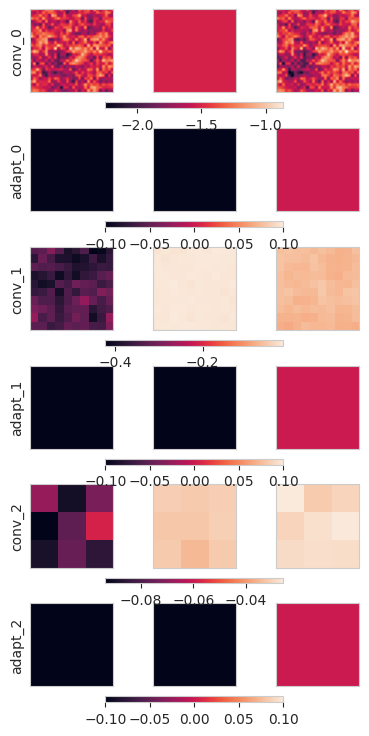

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.



┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       acc/0.2_False       │    0.14030000567436218    │
│       acc/0.2_True        │    0.08659999817609787    │
│       acc/0.4_False       │    0.1687999963760376     │
│       acc/0.4_True        │    0.17970000207424164    │
│       acc/0.6_False       │     0.195700004696846     │
│       acc/0.6_True        │    0.36640000343322754    │
│       acc/0.8_False       │    0.2249000072479248     │
│       acc/0.8_True        │    0.49559998512268066    │
│       acc/1.0_False       │    0.2551000118255615     │
│       acc/1.0_True        │    0.5371000170707703     │
│       acc_diff/0.2        │   -0.053700000047683716   │
│       acc_diff/0.4        │   0.010900000110268593    │
│       acc_diff/0.6        │    0.17069999873638153    │
│       acc_diff/0.8        │    0.27070000767707825    │
│       acc_diff/1.0        │    0.28200000524520874    │
│   cum_actv_diff/0.2_l0    │   0.0041159698739647865   │
│   cum_actv_diff/0.2_l1    │   0.0028389892540872097   │
│   cum_actv_diff/0.2_l2    │   0.001632224302738905    │
│   cum_actv_diff/0.4_l0    │   0.004100190941244364    │
│   cum_actv_diff/0.4_l1    │   0.003487330861389637    │
│   cum_actv_diff/0.4_l2    │   0.0025283093564212322   │
│   cum_actv_diff/0.6_l0    │   0.0039570629596710205   │
│   cum_actv_diff/0.6_l1    │   0.0035681643057614565   │
│   cum_actv_diff/0.6_l2    │   0.0029715877026319504   │
│   cum_actv_diff/0.8_l0    │   0.0037922475021332502   │
│   cum_actv_diff/0.8_l1    │   0.0033884153235703707   │
│   cum_actv_diff/0.8_l2    │   0.0030044622253626585   │
│   cum_actv_diff/1.0_l0    │   0.0036053257063031197   │
│   cum_actv_diff/1.0_l1    │   0.0030883457511663437   │
│   cum_actv_diff/1.0_l2    │   0.0028817933052778244   │
│         test_acc          │    0.2650200128555298     │
│         test_loss         │     3.031289577484131     │
└───────────────────────────┴───────────────────────────┘

<Axes: xlabel='name', ylabel='test_acc'>

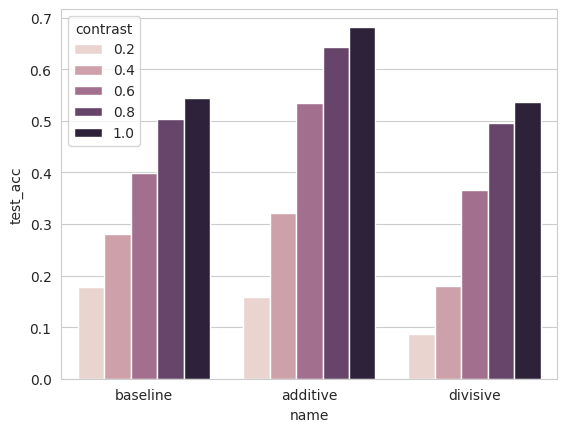

In [5]:
train_loader, test_loader, train_dataset, test_dataset = get_dataloaders('cifar10')
wandb_logger = pl.loggers.WandbLogger(project='ai-thesis', config=config,
                                      name=f'del')
trainer = pl.Trainer(logger=wandb_logger)
results = {'name': [], 'test_acc': [], 'contrast': []}
for name, model in models.items():
    print(name)
    res = trainer.test(model, test_loader)
    for contrast in [0.2, 0.4, 0.6, 0.8, 1.0]:
        results['name'].append(name)
        results['test_acc'].append(res[0][f'acc/{contrast}_True'])
        results['contrast'].append(contrast)

import seaborn as sns

sns.barplot(x='name', y='test_acc', data=results, hue='contrast')

Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Foun

baseline


Testing: 0it [00:00, ?it/s]

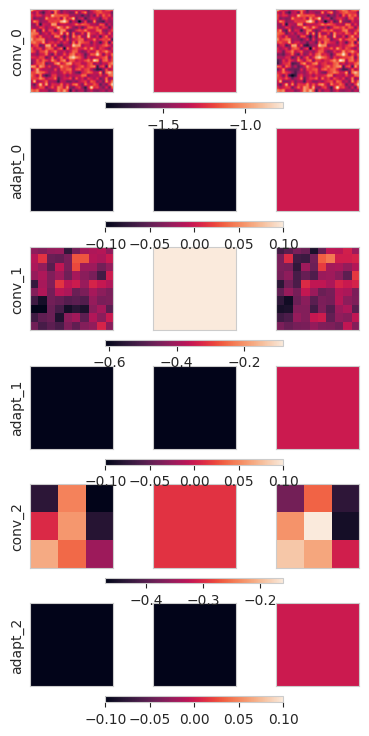

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.



┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       acc/0.2_False       │    0.18264999985694885    │
│       acc/0.2_True        │    0.1780499964952469     │
│       acc/0.4_False       │     0.274399995803833     │
│       acc/0.4_True        │    0.27924999594688416    │
│       acc/0.6_False       │     0.399399995803833     │
│       acc/0.6_True        │    0.3977999985218048     │
│       acc/0.8_False       │    0.4989500045776367     │
│       acc/0.8_True        │    0.5038999915122986     │
│       acc/1.0_False       │    0.5412499904632568     │
│       acc/1.0_True        │    0.5458999872207642     │
│       acc_diff/0.2        │   -0.004600000102072954   │
│       acc_diff/0.4        │   0.0048500001430511475   │
│       acc_diff/0.6        │  -0.0015999999595806003   │
│       acc_diff/0.8        │    0.00494999997317791    │
│       acc_diff/1.0        │   0.004650000017136335    │
│   cum_actv_diff/0.2_l0    │  -3.122513589914888e-05   │
│   cum_actv_diff/0.2_l1    │  -8.874144987203181e-05   │
│   cum_actv_diff/0.2_l2    │  -0.00014056569489184767  │
│   cum_actv_diff/0.4_l0    │  -2.2824713141744724e-06  │
│   cum_actv_diff/0.4_l1    │  -2.8616546842386015e-05  │
│   cum_actv_diff/0.4_l2    │   4.070090290042572e-05   │
│   cum_actv_diff/0.6_l0    │  -1.772721043380443e-05   │
│   cum_actv_diff/0.6_l1    │  1.4917653061274905e-05   │
│   cum_actv_diff/0.6_l2    │  -1.8273020032211207e-05  │
│   cum_actv_diff/0.8_l0    │   4.133539187023416e-05   │
│   cum_actv_diff/0.8_l1    │  2.0492456314968877e-05   │
│   cum_actv_diff/0.8_l2    │  2.1443836885737255e-05   │
│   cum_actv_diff/1.0_l0    │   4.901536522083916e-05   │
│   cum_actv_diff/1.0_l1    │  5.5251395679078996e-05   │
│   cum_actv_diff/1.0_l2    │  0.00011262940824963152   │
│         test_acc          │     0.379720002412796     │
│         test_loss         │    1.8286648988723755     │
└───────────────────────────┴───────────────────────────┘

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]


additive


Testing: 0it [00:00, ?it/s]

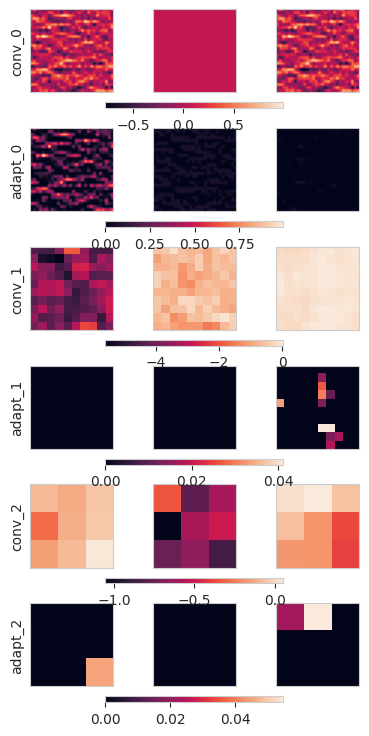

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.



┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       acc/0.2_False       │    0.1678999960422516     │
│       acc/0.2_True        │    0.1597999930381775     │
│       acc/0.4_False       │    0.20344999432563782    │
│       acc/0.4_True        │    0.32109999656677246    │
│       acc/0.6_False       │    0.23235000669956207    │
│       acc/0.6_True        │    0.5326499938964844     │
│       acc/0.8_False       │    0.2671999931335449     │
│       acc/0.8_True        │    0.6424999833106995     │
│       acc/1.0_False       │    0.29429998993873596    │
│       acc/1.0_True        │    0.6843500137329102     │
│       acc_diff/0.2        │   -0.008100000210106373   │
│       acc_diff/0.4        │    0.11765000224113464    │
│       acc_diff/0.6        │    0.3003000020980835     │
│       acc_diff/0.8        │    0.37529999017715454    │
│       acc_diff/1.0        │    0.3900499939918518     │
│   cum_actv_diff/0.2_l0    │    0.04053265601396561    │
│   cum_actv_diff/0.2_l1    │   -0.009663090109825134   │
│   cum_actv_diff/0.2_l2    │   0.010781151242554188    │
│   cum_actv_diff/0.4_l0    │   0.039135146886110306    │
│   cum_actv_diff/0.4_l1    │   -0.006159552372992039   │
│   cum_actv_diff/0.4_l2    │   0.011266419664025307    │
│   cum_actv_diff/0.6_l0    │   0.036634691059589386    │
│   cum_actv_diff/0.6_l1    │   -0.006812966428697109   │
│   cum_actv_diff/0.6_l2    │   0.011176582425832748    │
│   cum_actv_diff/0.8_l0    │    0.03392328694462776    │
│   cum_actv_diff/0.8_l1    │   -0.008338883519172668   │
│   cum_actv_diff/0.8_l2    │    0.01069481298327446    │
│   cum_actv_diff/1.0_l0    │   0.031019553542137146    │
│   cum_actv_diff/1.0_l1    │   -0.009773106314241886   │
│   cum_actv_diff/1.0_l2    │   0.009874720126390457    │
│         test_acc          │    0.3508000075817108     │
│         test_loss         │    2.3860042095184326     │
└───────────────────────────┴───────────────────────────┘

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]


divisive


Testing: 0it [00:00, ?it/s]

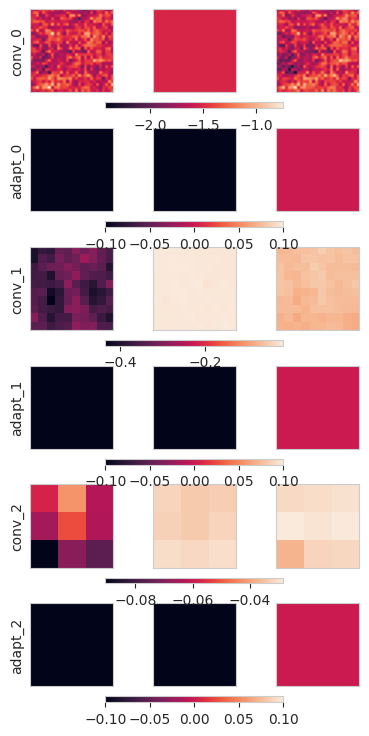

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.



┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       acc/0.2_False       │    0.14225000143051147    │
│       acc/0.2_True        │    0.08715000003576279    │
│       acc/0.4_False       │    0.17020000517368317    │
│       acc/0.4_True        │     0.178849995136261     │
│       acc/0.6_False       │    0.19609999656677246    │
│       acc/0.6_True        │    0.36500000953674316    │
│       acc/0.8_False       │    0.2243500053882599     │
│       acc/0.8_True        │    0.4969500005245209     │
│       acc/1.0_False       │    0.2562499940395355     │
│       acc/1.0_True        │     0.537850022315979     │
│       acc_diff/0.2        │   -0.05510000139474869    │
│       acc_diff/0.4        │    0.00865000020712614    │
│       acc_diff/0.6        │    0.1688999980688095     │
│       acc_diff/0.8        │     0.272599995136261     │
│       acc_diff/1.0        │    0.2815999984741211     │
│   cum_actv_diff/0.2_l0    │   0.004118714481592178    │
│   cum_actv_diff/0.2_l1    │   0.002832066500559449    │
│   cum_actv_diff/0.2_l2    │   0.0016079760389402509   │
│   cum_actv_diff/0.4_l0    │   0.004100284539163113    │
│   cum_actv_diff/0.4_l1    │   0.003482787637040019    │
│   cum_actv_diff/0.4_l2    │   0.002539576729759574    │
│   cum_actv_diff/0.6_l0    │   0.0039580222219228745   │
│   cum_actv_diff/0.6_l1    │   0.0035588291939347982   │
│   cum_actv_diff/0.6_l2    │   0.0029473244212567806   │
│   cum_actv_diff/0.8_l0    │   0.0037936458829790354   │
│   cum_actv_diff/0.8_l1    │   0.003386924508959055    │
│   cum_actv_diff/0.8_l2    │   0.0030070561915636063   │
│   cum_actv_diff/1.0_l0    │   0.0036064430605620146   │
│   cum_actv_diff/1.0_l1    │   0.0030919252894818783   │
│   cum_actv_diff/1.0_l2    │   0.002891774056479335    │
│         test_acc          │    0.26596999168395996    │
│         test_loss         │     3.022243022918701     │
└───────────────────────────┴───────────────────────────┘

<Axes: xlabel='name', ylabel='test_acc'>

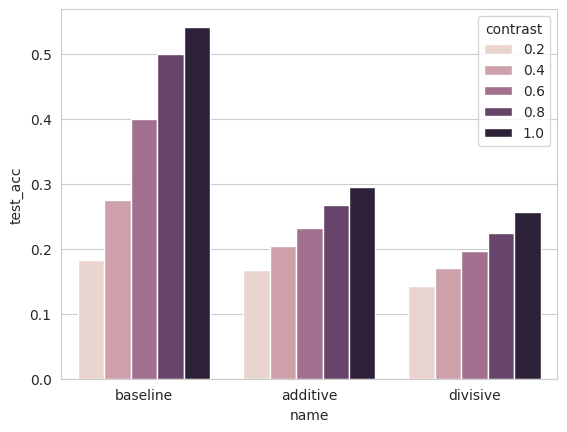

In [6]:
train_loader, test_loader, train_dataset, test_dataset = get_dataloaders('cifar10')
wandb_logger = pl.loggers.WandbLogger(project='ai-thesis', config=config,
                                      name=f'del')
trainer = pl.Trainer(logger=wandb_logger)
results = {'name': [], 'test_acc': [], 'contrast': []}
for name, model in models.items():
    print(name)
    res = trainer.test(model, test_loader)
    for contrast in [0.2, 0.4, 0.6, 0.8, 1.0]:
        results['name'].append(name)
        results['test_acc'].append(res[0][f'acc/{contrast}_False'])
        results['contrast'].append(contrast)

import seaborn as sns

sns.barplot(x='name', y='test_acc', data=results, hue='contrast')

In [9]:
models['divisive'].model.adapt_layers[0].alpha, models['divisive'].model.adapt_layers[0].sigma, models['divisive'].model.adapt_layers[0].K

(Parameter containing:
 tensor(-1.6051, requires_grad=True),
 Parameter containing:
 tensor(0.0276, requires_grad=True),
 Parameter containing:
 tensor(0.0067, requires_grad=True))

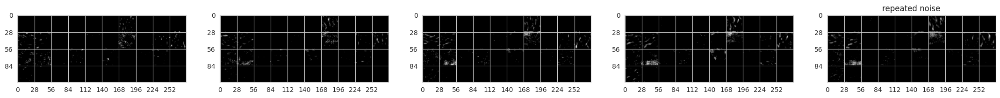

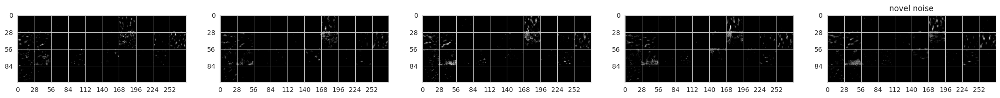

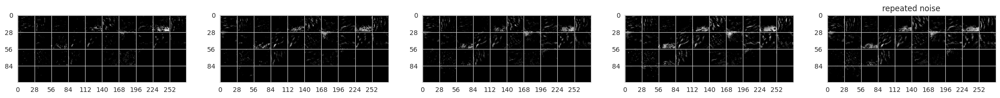

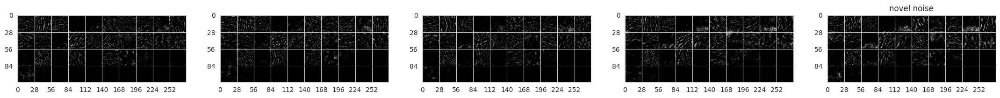

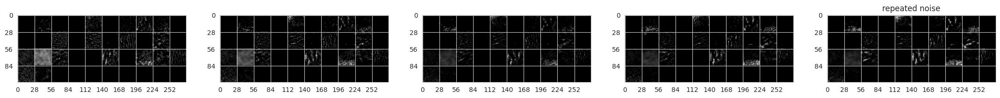

Text(0.5, 1.0, 'novel noise')

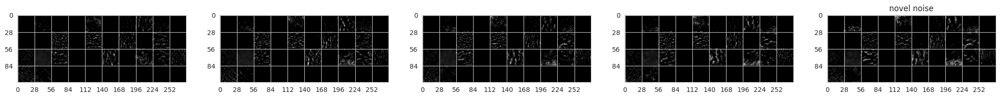

In [12]:
import matplotlib.pyplot as plt
import numpy as np
layer = 0
idx = 0
actvs_grid(models['baseline'], test_dataset, idx, layer)
plt.title('repeated noise')
plt.show()
actvs_grid(models['baseline'], test_dataset, idx + 50000, layer)
plt.title('novel noise')
plt.show()
actvs_grid(models['additive'], test_dataset, idx, layer)
plt.title('repeated noise')
plt.show()
actvs_grid(models['additive'], test_dataset, idx + 50000, layer)
plt.title('novel noise')
plt.show()
actvs_grid(models['divisive'], test_dataset, idx, layer)
plt.title('repeated noise')
plt.show()
actvs_grid(models['divisive'], test_dataset, idx + 50000, layer)
plt.title('novel noise')